### Semi-autonomous Teleoperation Demo : Place task in `Kitchen Plate` scene with `small size dish rack`

### Parse `Realistic Scene`

In [1]:
import mujoco#,cv2,pyvista
import numpy as np
import matplotlib.pyplot as plt
import sys
sys.path.append('../../../')
from utils.mujoco_parser import MuJoCoParserClass

from utils.util import sample_xyzs,rpy2r,r2rpy,r2quat,compute_view_params,get_interp_const_vel_traj, printmd
np.set_printoptions(precision=2,suppress=True,linewidth=100)
plt.rc('xtick',labelsize=6); plt.rc('ytick',labelsize=6)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
print ("MuJoCo version:[%s]"%(mujoco.__version__))

MuJoCo version:[2.3.3]


In [2]:
xml_path = '../../../asset/scene_kitchen_dish_rack_small.xml'
env = MuJoCoParserClass(name='Place task scene: Plate table',rel_xml_path=xml_path,VERBOSE=False, MODE='window')
print(env.MODE)

# Move tables and robot base
env.model.body('base_table').pos = np.array([0,0,0])
env.model.body('base').pos = np.array([0.18,0,0.79])
env.model.body('avoiding_object_table').pos = np.array([0.38+0.45,0,0])
env.model.body('right_object_table').pos = np.array([-0.05,-0.80,0])
env.model.body('left_object_table').pos = np.array([-1.5,0.80,0])

# Place objects
obj_box_names = [body_name for body_name in env.body_names
             if body_name is not None and (body_name.startswith("obj_box"))]
n_box_obj = len(obj_box_names)
env.place_objects_random(n_obj=n_box_obj, obj_names=obj_box_names, x_range=[0.80, 1.15], y_range=[-3.15, -2.15], COLORS=False, VERBOSE=True)

jntadr_mug_cup = env.model.body('mug_cup').jntadr[0]
env.model.joint(jntadr_mug_cup).qpos0[:3] = np.array([ 0.9, -0.3, 0.85])
env.model.joint(jntadr_mug_cup).qpos0[3:] = r2quat(rpy2r(np.radians([0, 0, np.random.rand() * 360])))

jntadr_tray = env.model.body('tray').jntadr[0]
env.model.joint(jntadr_tray).qpos0[:3] = np.array([0.9,-0.3,0.80])
# env.model.joint(jntadr_tray).qpos0[3:] = r2quat(rpy2r(np.radians([0, 0, 0])))

jntadr_dish_rack = env.model.body('rack_base').jntadr[0]
pos_dish_rack = np.array([0.9,0.35,0.82])
env.model.joint(jntadr_dish_rack).qpos0[:3] = pos_dish_rack
dish_rack_random_rot = 0 # np.random.rand() * 360
env.model.joint(jntadr_dish_rack).qpos0[3:] = r2quat(rpy2r(np.radians([0, 0, dish_rack_random_rot])))


# Target dish
env.model.joint(env.model.body('kitchen-plate').jntadr[0]).qpos0[:3] = np.array([0.2, -0.7, 0.8])
# Set the dishes
env.model.joint(env.model.body('kitchen-plate-2').jntadr[0]).qpos0[:3] = pos_dish_rack + np.array([0.,0.0, 0.15])
env.model.joint(env.model.body('kitchen-plate-2').jntadr[0]).qpos0[3:] = r2quat(rpy2r(np.radians([0, 90, 90])))
env.model.joint(env.model.body('kitchen-plate-3').jntadr[0]).qpos0[:3] = pos_dish_rack + np.array([0., -0.1, 0.15])
env.model.joint(env.model.body('kitchen-plate-3').jntadr[0]).qpos0[3:] = r2quat(rpy2r(np.radians([0, 90, 90])))
env.model.joint(env.model.body('kitchen-plate-4').jntadr[0]).qpos0[:3] = pos_dish_rack + np.array([-2.5, 0.1, 0.15])
env.model.joint(env.model.body('kitchen-plate-4').jntadr[0]).qpos0[3:] = r2quat(rpy2r(np.radians([0, 90, 90])))

env.reset()

window


In [3]:
import openai 
import os 
openai.api_key = 'your key' 

def gauss_2d(mu, sigma=0.01):
    x = random.gauss(mu[0], sigma)
    y = random.gauss(mu[1], sigma)
    return (x, y)


class ChatGPT():
    def __init__ (self, model_engine='text-davinci-003'):
        self.model_engine = model_engine
        self.msg_history_turbo = []
        self.msg_history_davinci = ""
        self.role = 'user'
        
    def get_answer(self, prompt=None):
        if self.model_engine == 'gpt-3.5-turbo':
            self.msg_history_turbo.append({"role": self.role, "content":prompt})
            response   = openai.ChatCompletion.create(
            model      = self.model_engine,
            messages   = self.msg_history_turbo)
            reply_text = response['choices'][0]['message']['content']
            self.msg_history_turbo.append({"role":"assistant", "content":reply_text})

        elif self.model_engine == 'text-davinci-003': 
            self.msg_history_davinci += "You: "+prompt 
            response   = openai.Completion.create(
            engine     = self.model_engine,
            prompt     = self.msg_history_davinci,
            max_tokens = 512,
            temperature= 1.0,
            n          = 1,
            #stop       = ["You:", "AI:"]
            )
            reply_text = response.choices[0].text.strip().replace('Answer: ', '')
            self.msg_history_davinci+="\n"+"AI: "+reply_text+"\n"
        # print("ChatGPT: {}".format(reply_text))
        return reply_text

print("Done.")

Done.


In [4]:

for i in range(20):
    engine = "gpt-3.5-turbo"
    llm = ChatGPT(model_engine=engine)

    prompt = '''
    We have a manipulator and we want you to help plan how it should move to perform tasks using the following template:
    The rack has slots aligned along the y-axis

    The plate size is {x:0.14, y:0.02, z:0.14}m.
    The dish rack size is {x:0.17, y:0.07, z:0.28}m.
    The center of mass of Plate2 is placed in a rack where the coordinate is {x: 0.9, y: 0.29, z: 0.82}m.
    The center of mass of Plate3 is placed in a rack where the coordinate is {x: 0.9, y: 0.23, z: 0.82}m.
    The rack has slots aligned along the y-axis.

    Place a dish plate into a dish rack, and tell me the range.

    [start of plan]
    [optional] To perform this task, the manipulator's gripper should move close to dish plate
    [optional] dish plate should be close to dish rack.
    [optional] The center of mass of dish rack is placed on {x:0.9, y:0.35, z:0.82}m.
    [optional] The range of the dish plate is able to be placed in the dish rack {MINIMUM RANGE: 0.0, 0.0, 0.0}m and {MAXIMUM RANGE: 0.0, 0.0, 0.0}.
    [end of plan]

    Rules:
    1. If you see phrases like {MINIMUM RANGE: default x value, default y value, default z value}, {MAXIMUM RANGE: default x value, default y value, default z value}
    replace the entire phrase with a numerical value.
    2. If you see [optional], it means you only add that line if necessary for the task, otherwise remove that line.
    3. Do not invent new objects not listed here.
    4. I will tell you a behavior/skill/task that I want the manipulator to perform and you will provide the full plan,
    even if you may only need to change a few lines. Always start the description with [start of plan] and end it with [end of plan].
    5. You can assume that the robot is capable of doing anything, even for the most challenging task.
    6. Your plan should be as close to the provided template as possible. Do not include additional details.
    7. The robot is facing towards positive x-axis, positive y-axis is to the left of the robot, positive z-axis is upward.
    8. Objects are free to move around unless a command is given.
    9. Answer the range {MINIMUM RANGE: 0.0, 0.0, 0.0}m and {MAXIMUM RANGE: 0.0, 0.0, 0.0} where a dish is able to be placed in the dish rack.
    If you understand, say Yes.
    '''

    response = llm.get_answer(prompt)
    print("Answer: ", response)


    # llm = ChatGPT(model_engine=engine)
    prompt = '''
    We have a plan of a robot arm with gripper to place objects and we want you to turn that into the corresponding reward specifying program with following functions:

    ```
    def set_l2_distance_reward(name_obj_A, name_obj_B)
    ```
    where name_obj_A and name_obj_B are selected from ['dish rack', 'dish plate'].
    This term sets a reward for minimizing l2_distance between name_obj_A and name_obj_B so they get closer to each other.

    ```
    def set_obj_orientation_reward(name_obj, x_axis_rotation_radians, z_axis_rotation_radians)
    ```
    this term encourages the orientation of name_obj to be close to the target.

    ```
    def execute_plan(duration=2)
    ```
    This function sends the parameters to the robot and execute the plan for `duration` seconds, default to be 2

    ```
    def set_obj_position_reward(name_obj, x_offset, y_offset, z_height)
    ```
    this term encourages the position of name_obj to be close to the specified target position.

    ```
    def reset_reward()
    ```
    This function resets the reward to default values.

    This is the first plan for a new task.

    Example answer code:
    ```
    import numpy as np

    reset_reward() # This is a new task so reset reward; otherwise we don't need it
    set_l2_distance_reward("dish rack", "dish plate")
    set_obj_orientation_reward("dish plate", np.deg2rad(30), 0)
    set_obj_position_reward("dish plate", 0, 0, 1.0)

    execute_plan(4)
    ```

    Remember:
    1. Always format the code in code blocks. In your response execute_plan should be called exactly once at the end.
    2. Do not invent new functions or classes. The only allowed functions you can call are the ones listed above. Do not leave unimplemented code blocks in your response.
    3. The only allowed library is numpy. Do not import or use any other library.
    4. If you are not sure what value to use, just use your best judge. Do not use None for anything.
    5. Do not calculate the position or direction of any object (except for the ones provided above). Just use a number directly based on your best guess.
    6. You do not need to make the robot do extra things not mentioned in the plan such as stopping the robot.

    If you understand, say Yes.
    '''
    response = llm.get_answer(prompt)
    print("Answer: ", response)


    prompt = "Put a dish plate into a dish rack"
    
    response = llm.get_answer(prompt)
    print("Answer: ", response)

Answer:  Yes.
Answer:  Yes.
Answer:  ```
import numpy as np

reset_reward() # This is a new task so reset reward; otherwise, we don't need it
set_l2_distance_reward("dish rack", "dish plate")
set_obj_orientation_reward("dish plate", 0, 0) # No rotation needed
set_obj_position_reward("dish plate", 0, -0.06, 0.28) # Place the dish plate slightly above the dish rack

execute_plan(2)
```

Answer:  Yes.
Answer:  Yes.
Answer:  ```
import numpy as np

reset_reward()
set_l2_distance_reward("dish rack", "dish plate")
set_obj_orientation_reward("dish plate", 0, 0)
set_obj_position_reward("dish plate", -0.02, 0, 0.24)

execute_plan(2)
```

Answer:  Yes.
Answer:  Yes.
Answer:  import numpy as np

reset_reward()
set_l2_distance_reward("dish rack", "dish plate")
set_obj_position_reward("dish plate", 0, -0.06, 0.82)

execute_plan(2)
Answer:  Yes.
Answer:  Yes.
Answer:  ```
import numpy as np

reset_reward() 
set_l2_distance_reward("dish rack", "dish plate")
set_obj_position_reward("dish plate", 0, 0,

1. Result: (0.9785930277345154, 0.32923370979034533)
[ 0.5  -0.01  1.16]


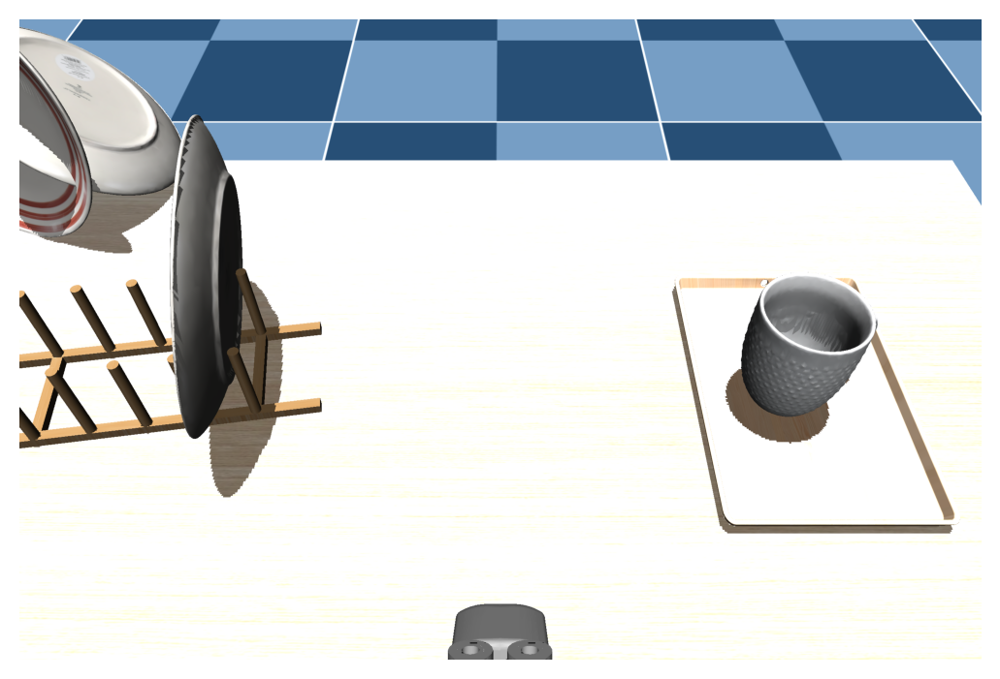

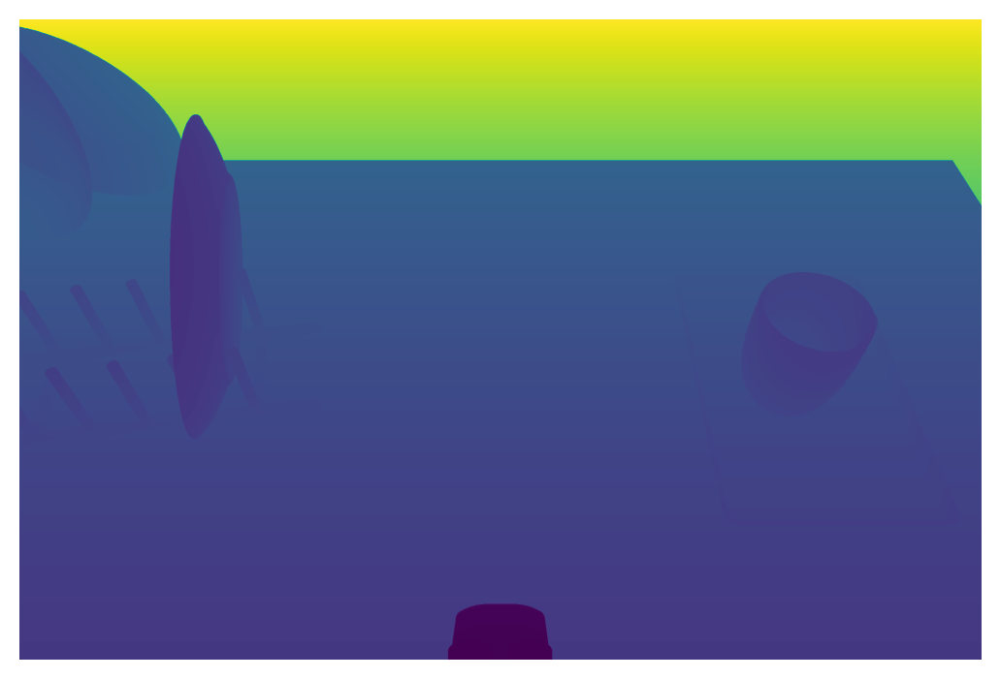

2. Result: (0.9677918124278914, 0.343453569178217)
[ 0.5  -0.01  1.16]


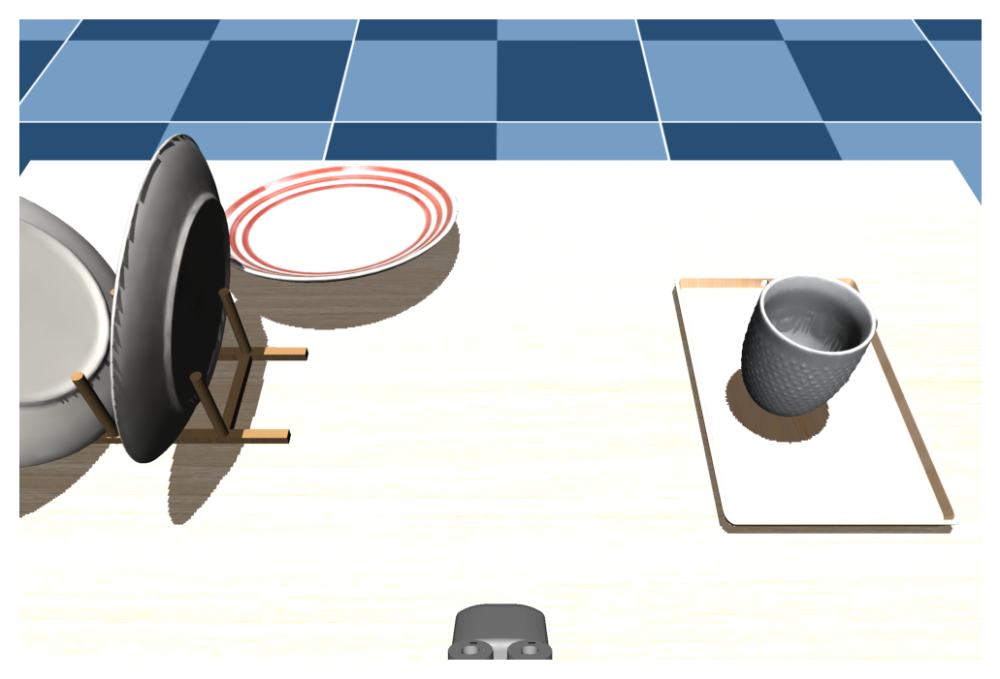

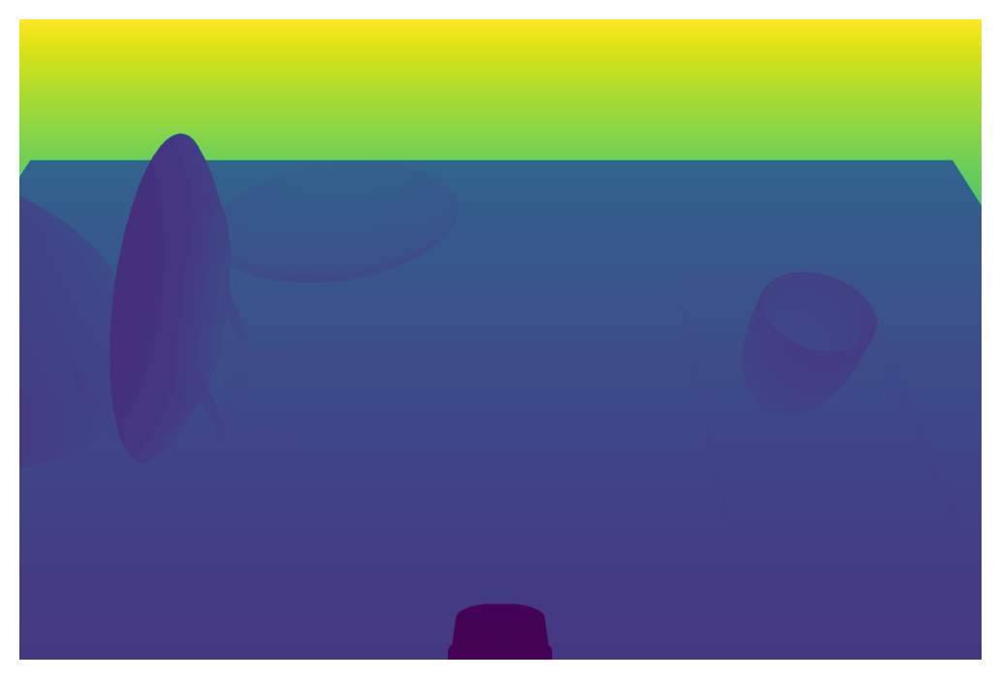

3. Result: (0.9045119297226349, 0.3061465638162282)
[ 0.5  -0.01  1.16]


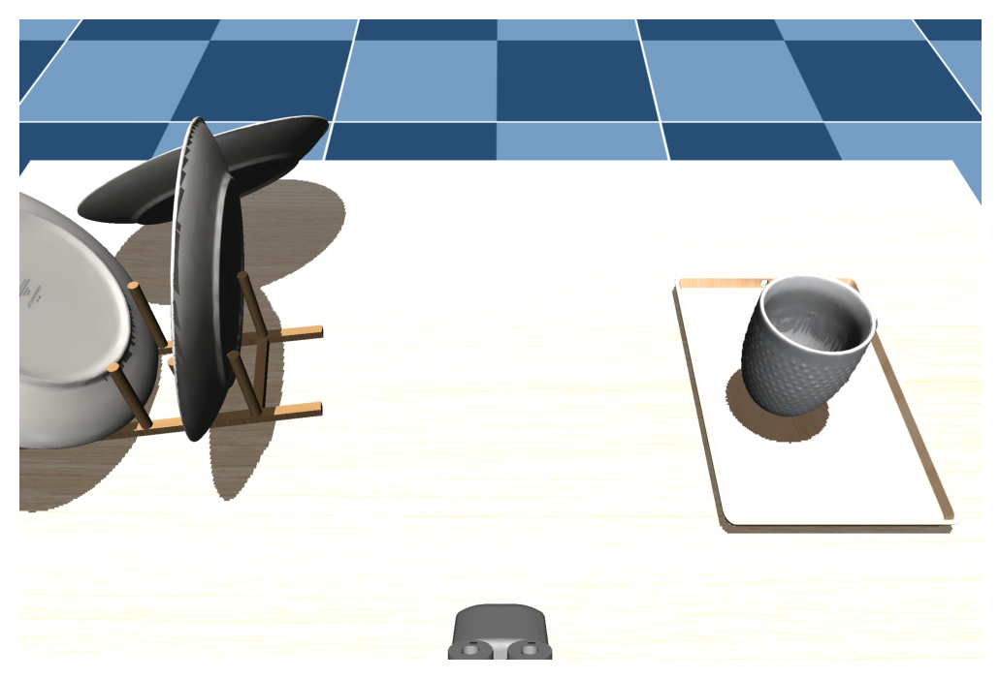

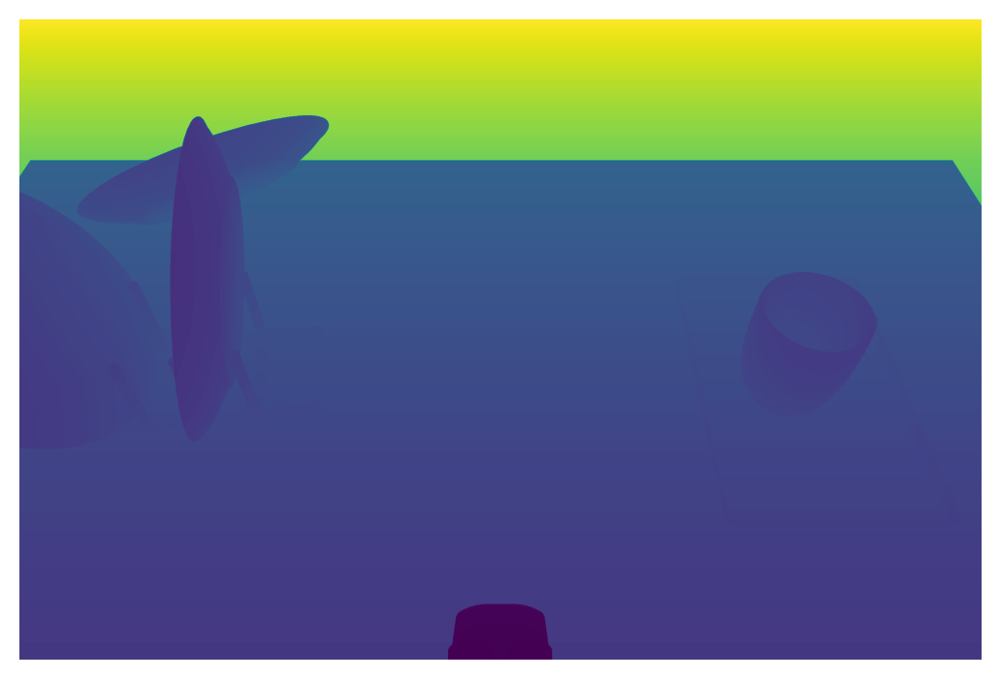

4. Result: (0.9154690834538349, 0.38269963078501557)
[ 0.5  -0.01  1.16]


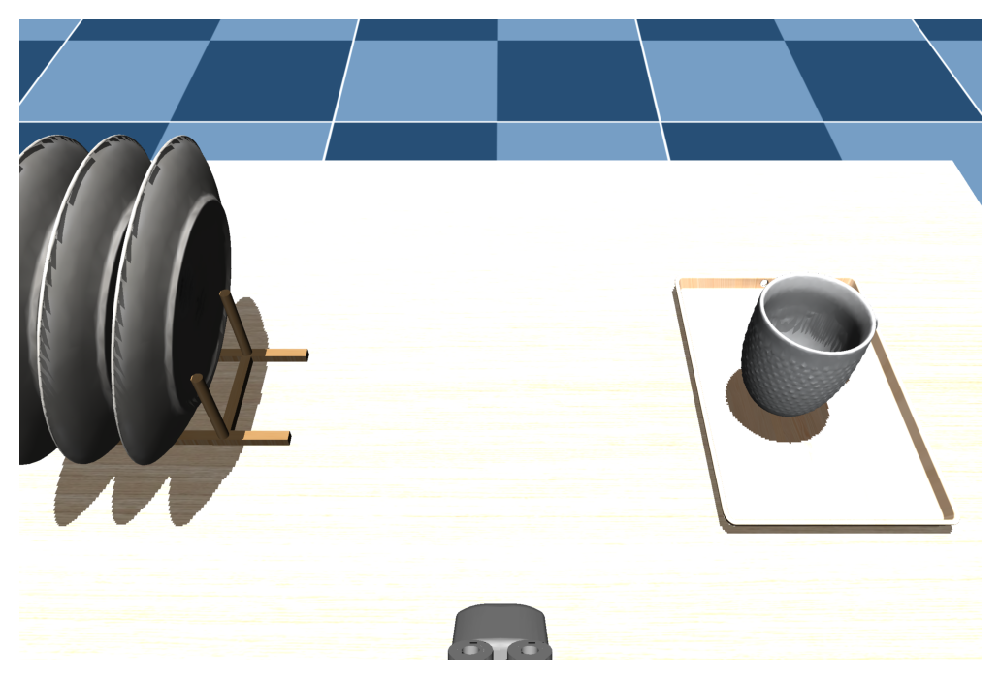

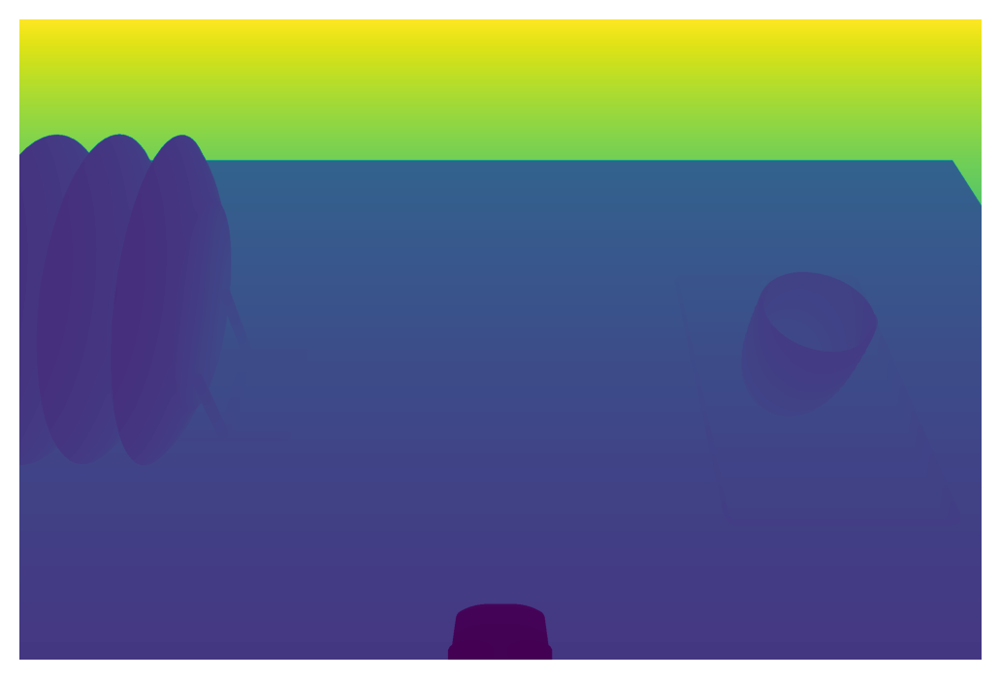

5. Result: (0.9444912348984419, 0.3606665159279801)
[ 0.5  -0.01  1.16]


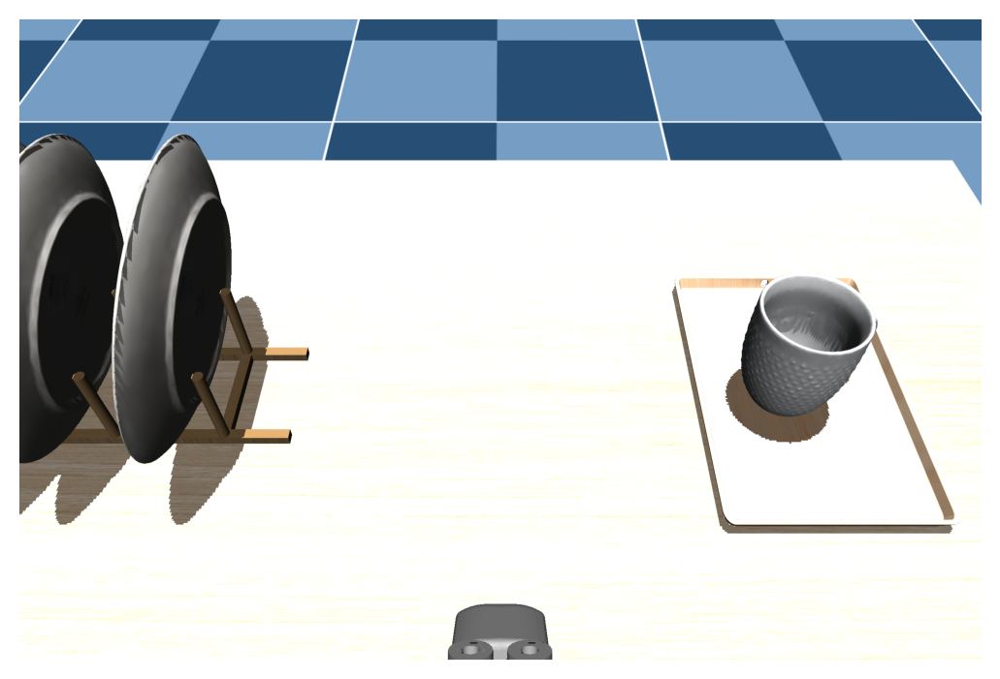

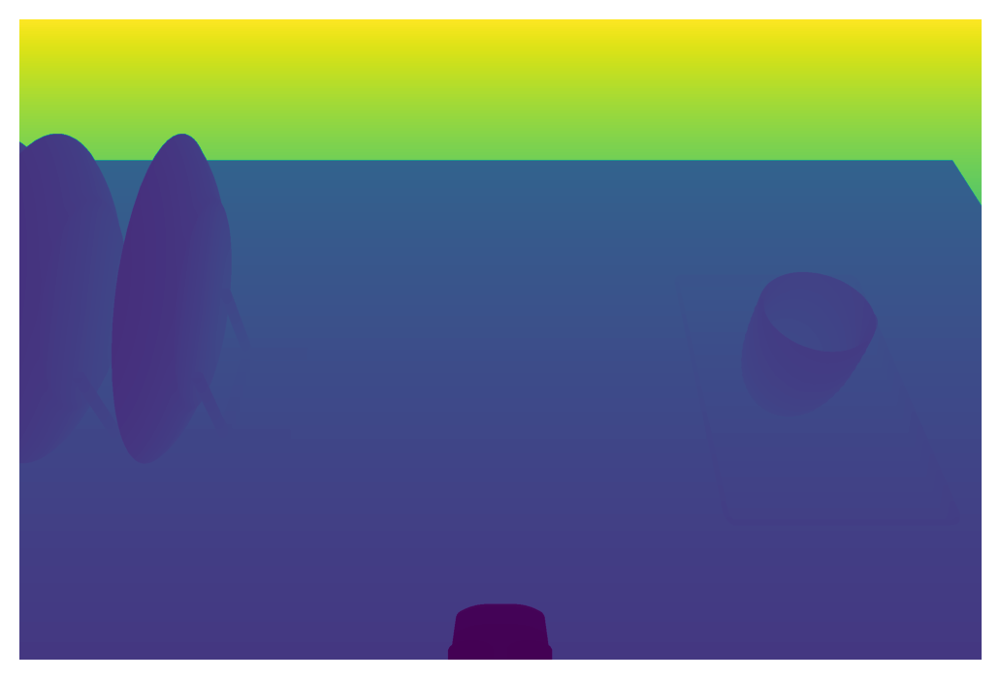

6. Result: (0.8487238228072641, 0.3613289261371012)
[ 0.5  -0.01  1.16]


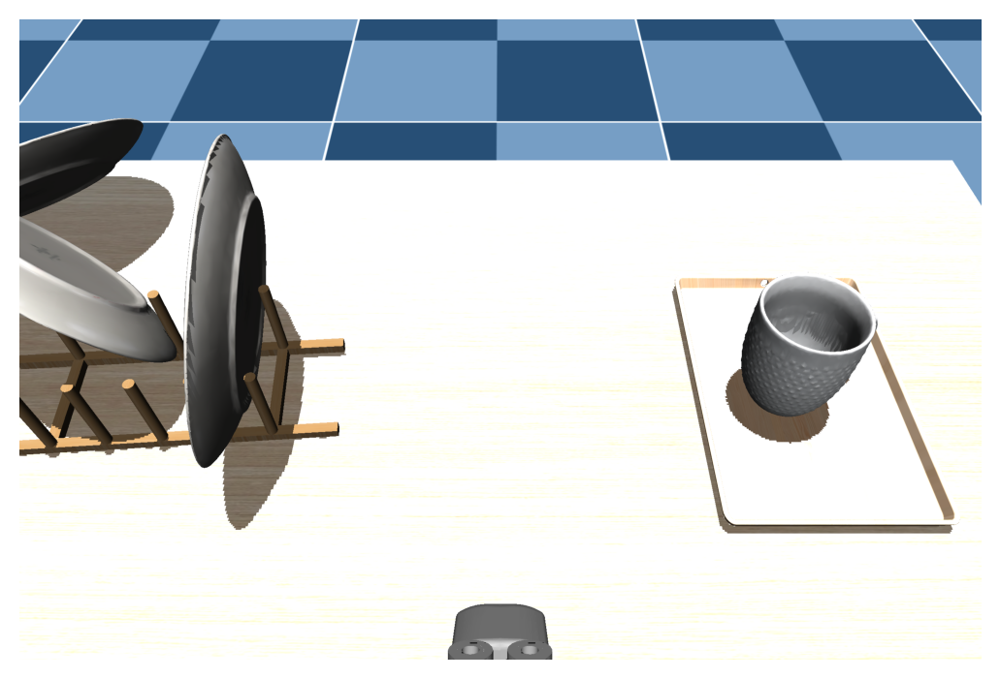

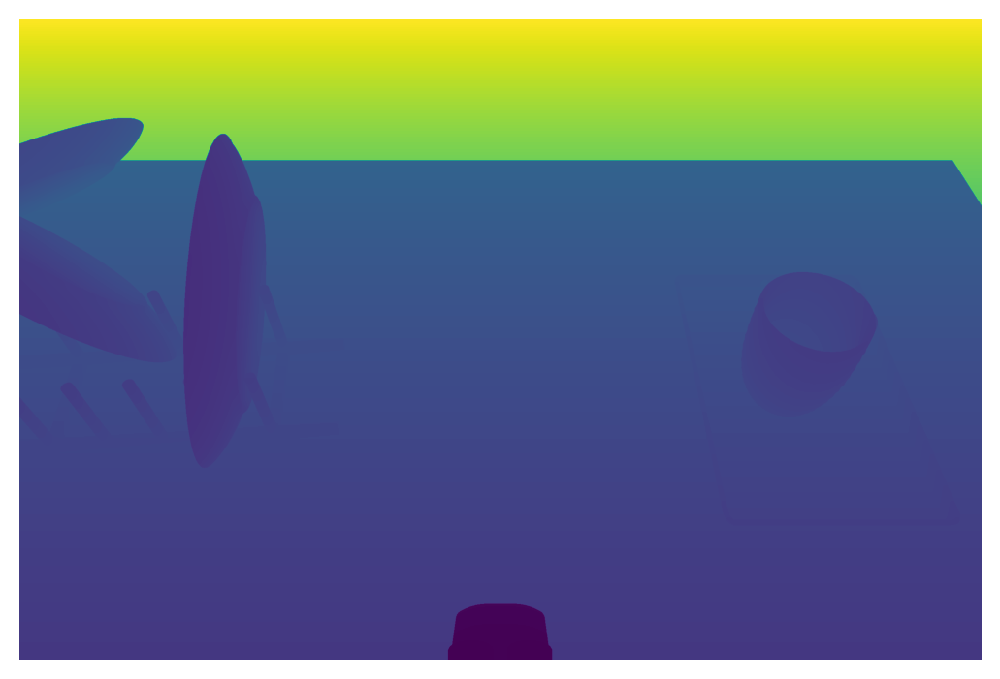

7. Result: (0.9366755723275952, 0.3235022114678402)
[ 0.5  -0.01  1.16]


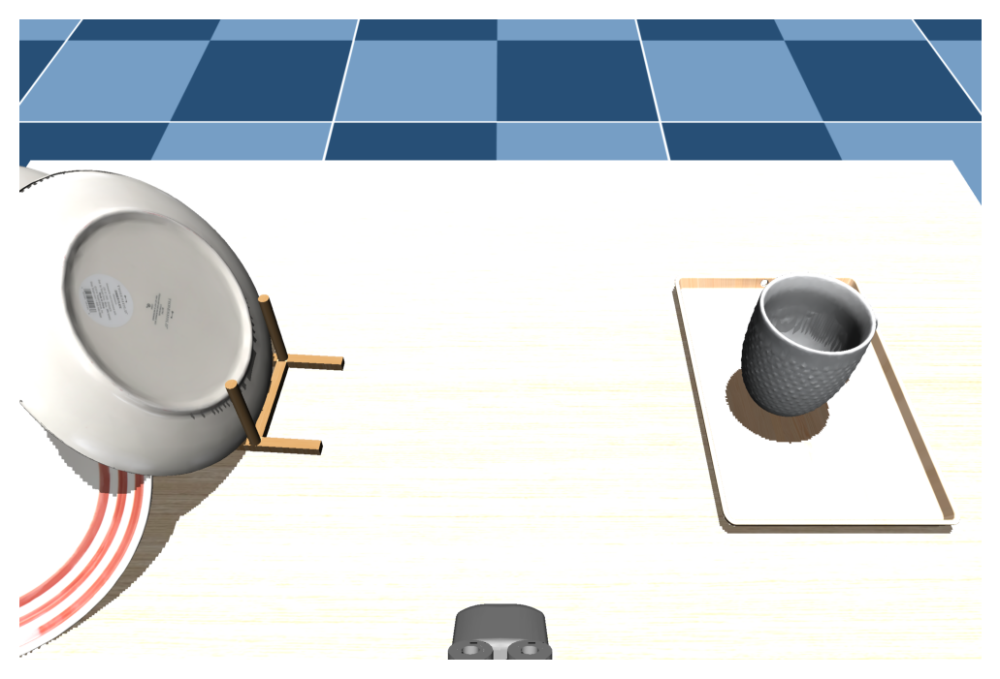

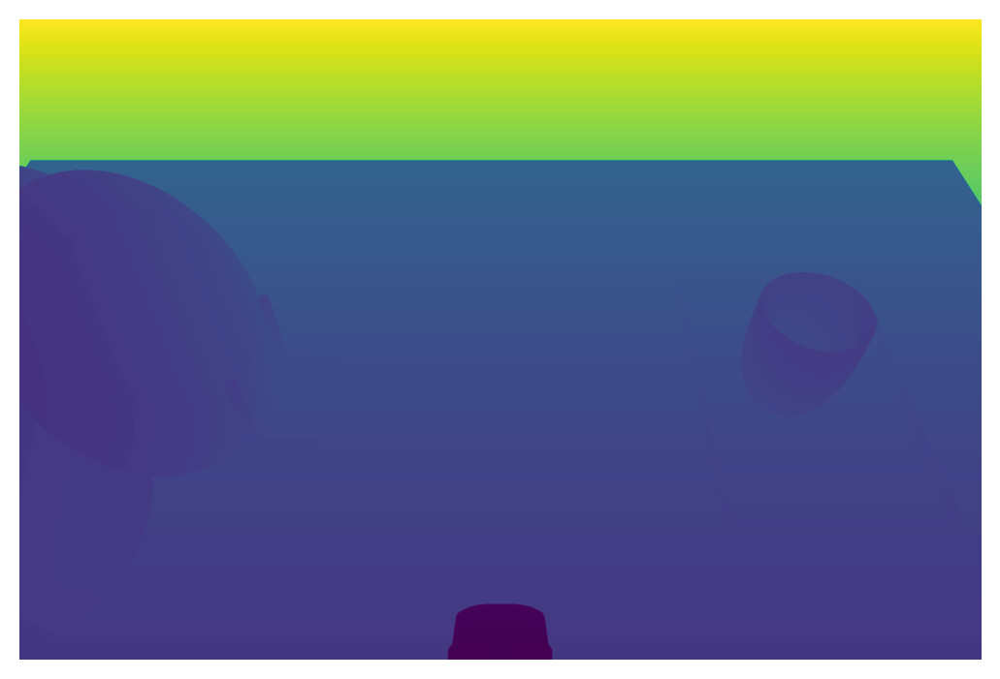

8. Result: (0.9011784690145882, 0.3399306864455926)
[ 0.5  -0.01  1.16]


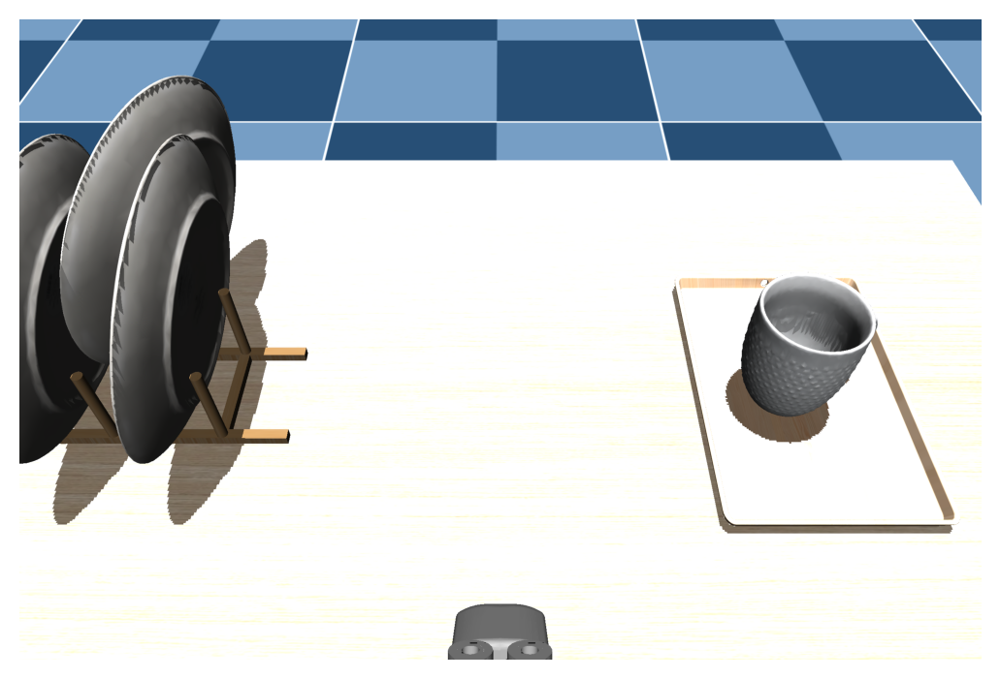

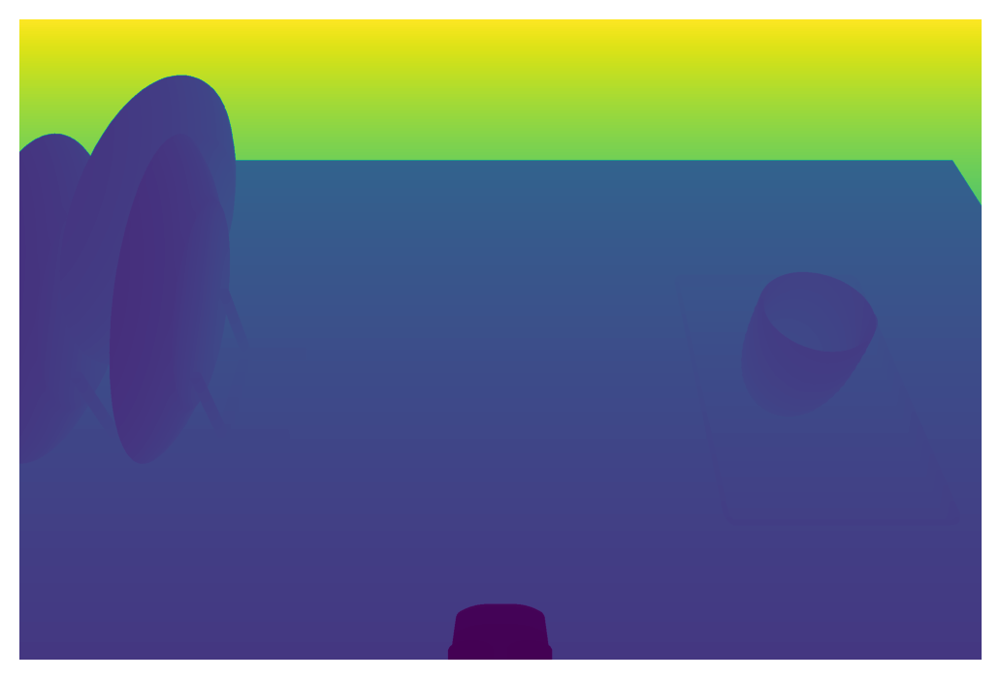

9. Result: (0.971746287894462, 0.30834697901733027)
[ 0.5  -0.01  1.16]


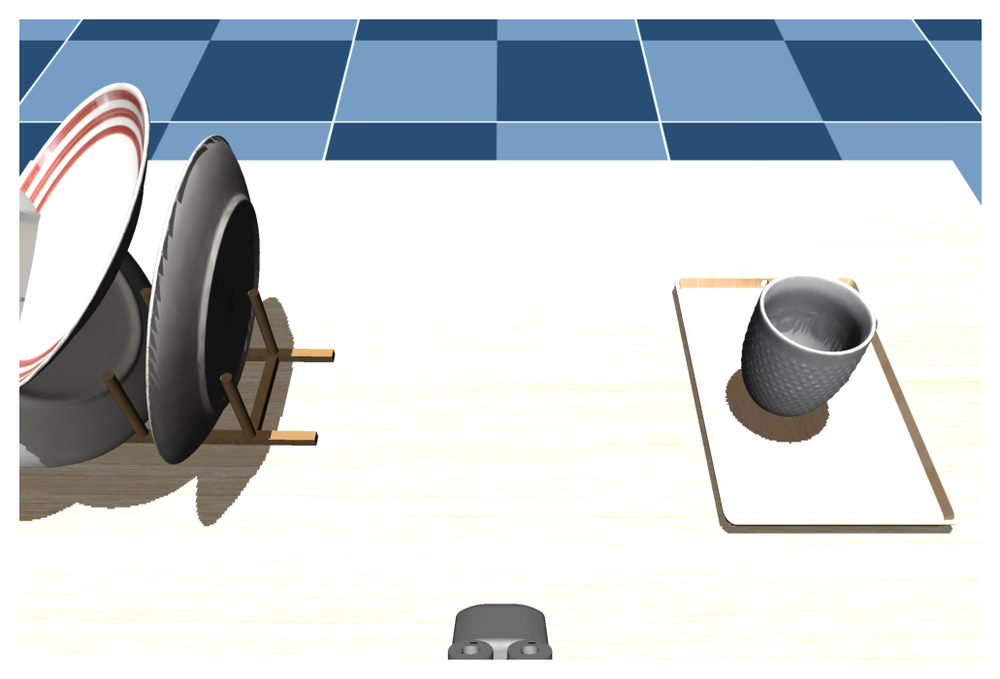

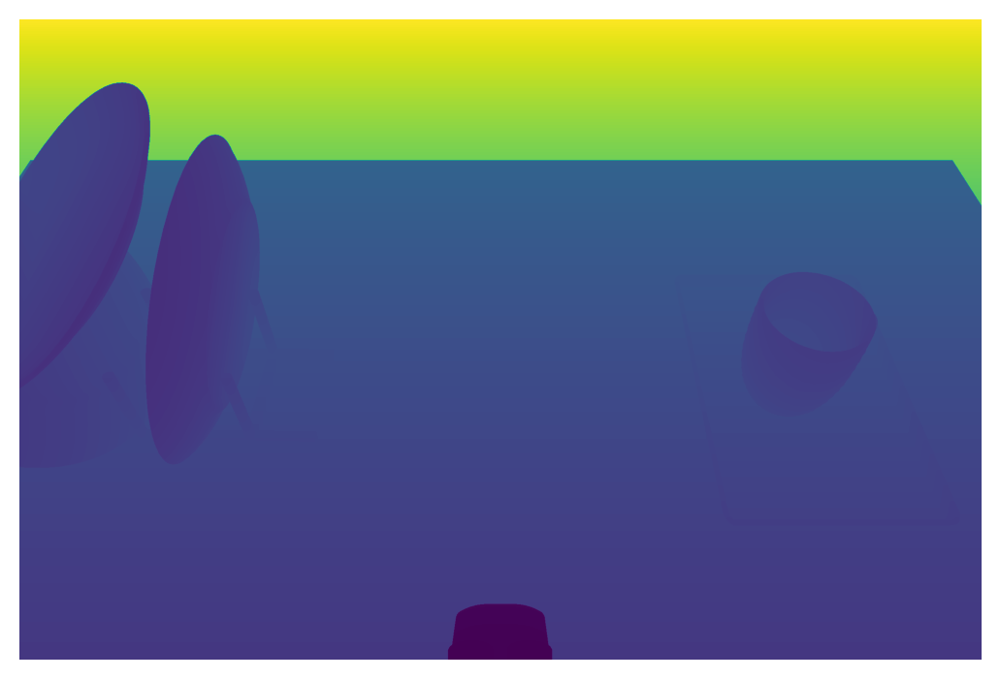

10. Result: (0.9071658489579115, 0.38085354251051756)
[ 0.5  -0.01  1.16]


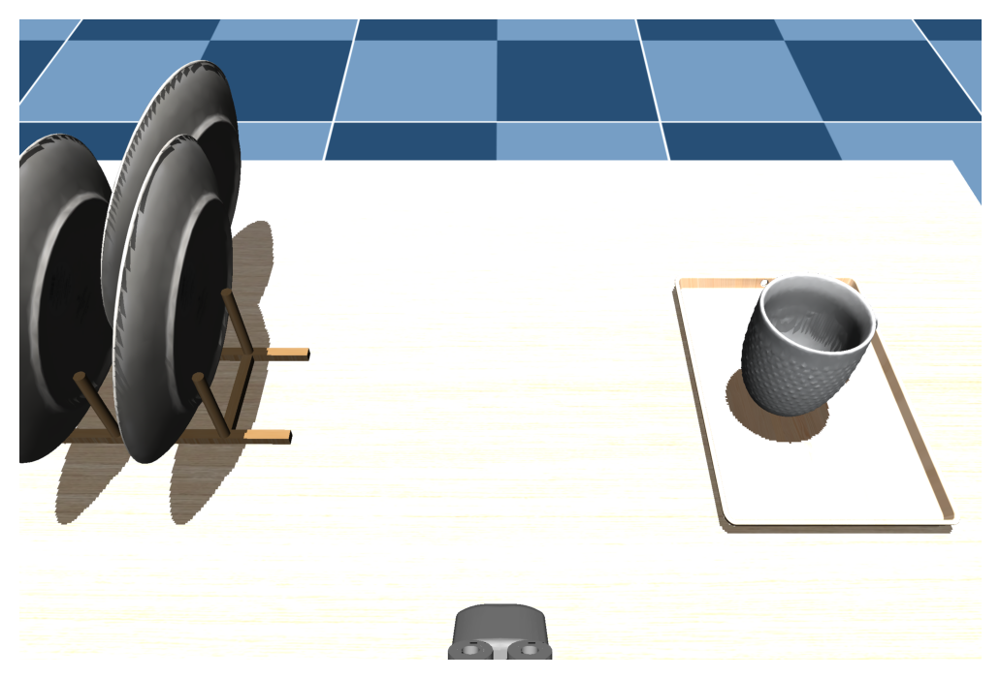

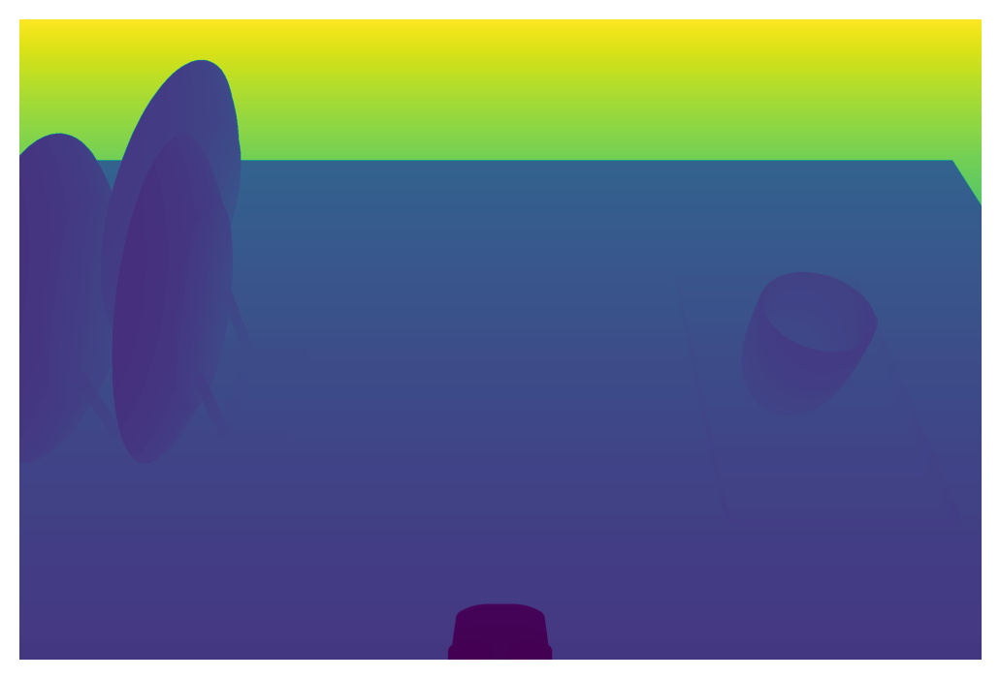

11. Result: (0.9066154760171675, 0.3290724557241718)
[ 0.5  -0.01  1.16]


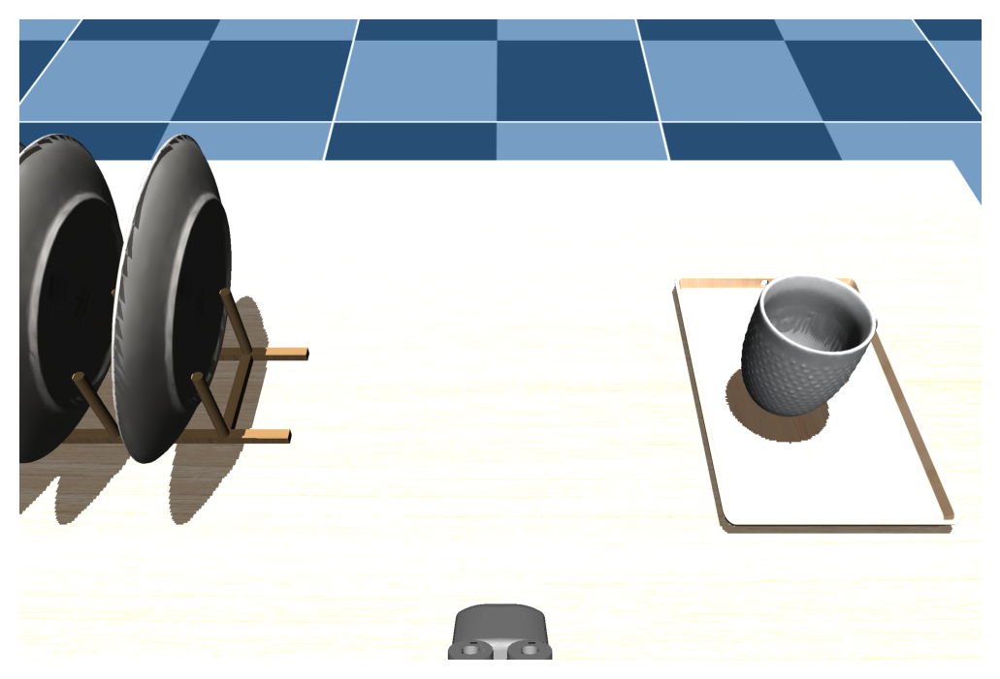

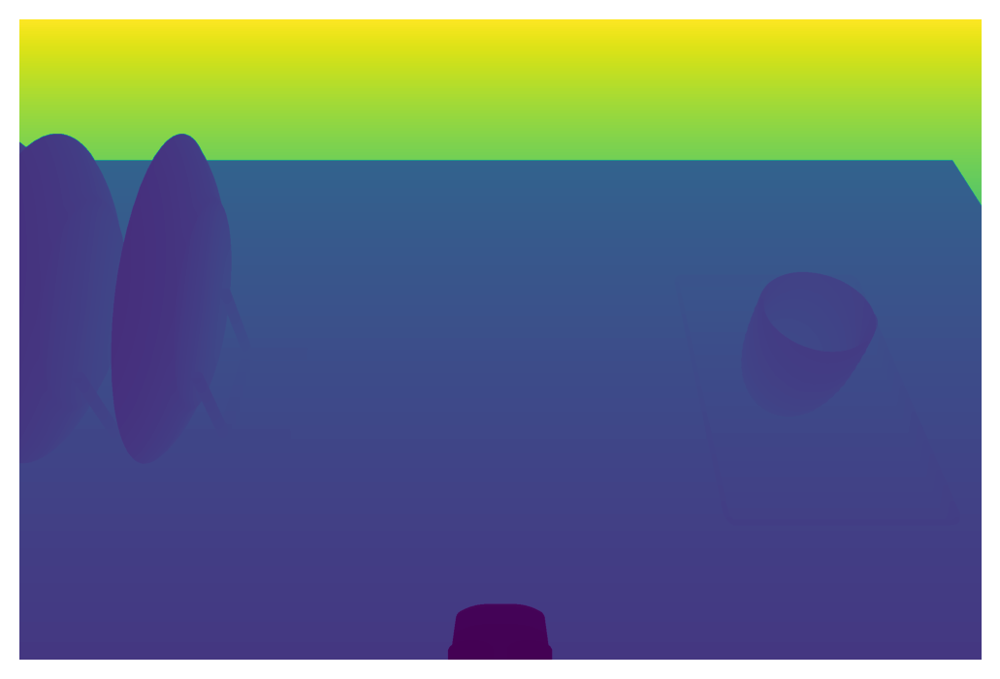

12. Result: (0.9229332904186603, 0.30276131870092915)
[ 0.5  -0.01  1.16]


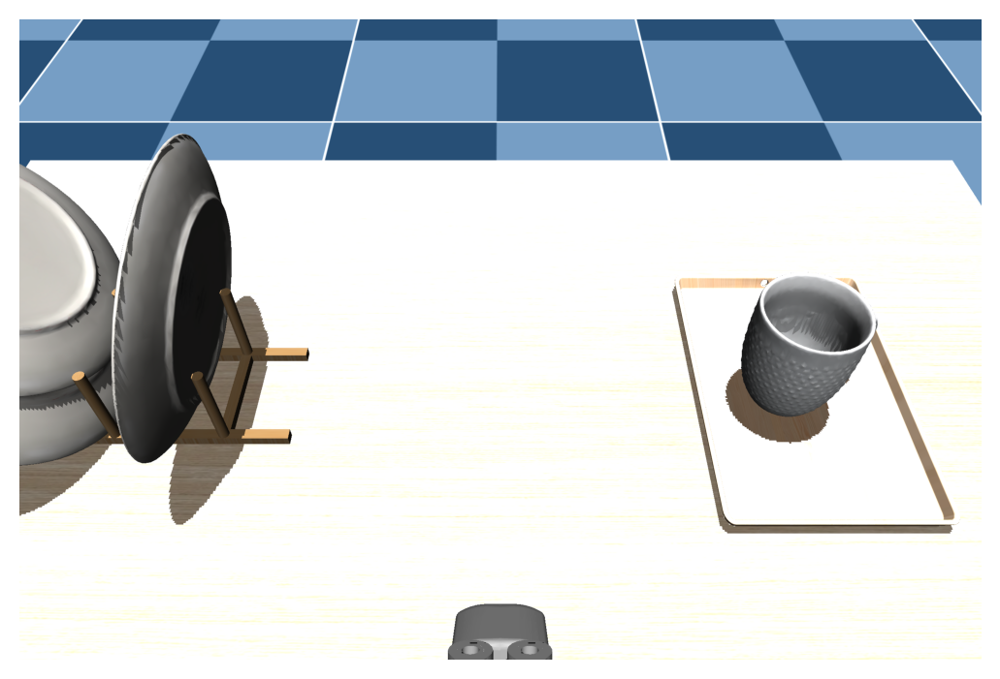

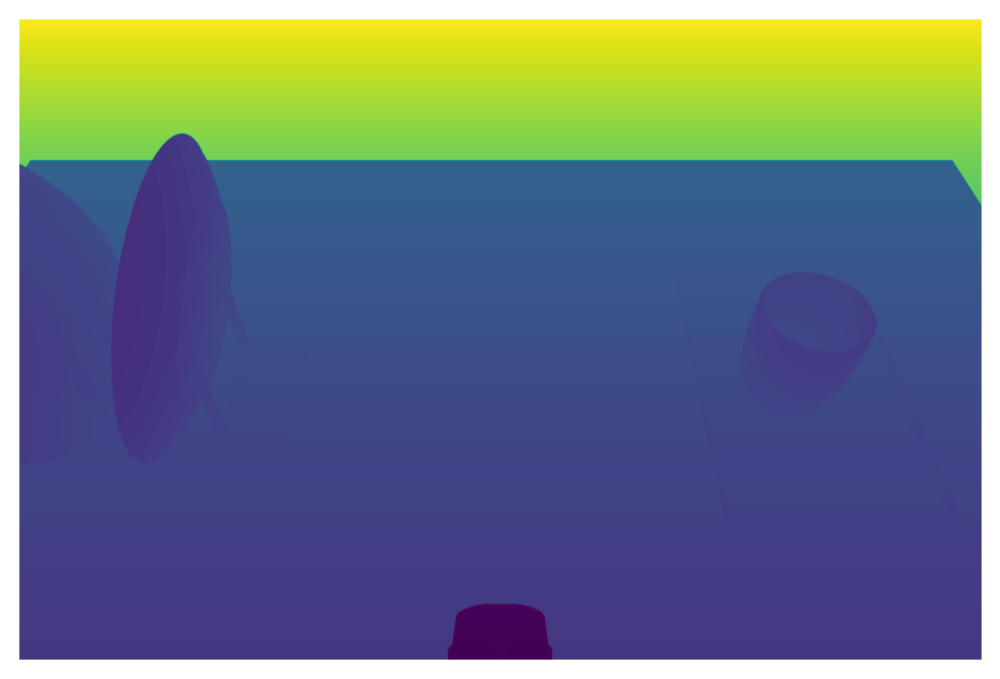

13. Result: (0.9265983629045004, 0.30371147209079097)
[ 0.5  -0.01  1.16]


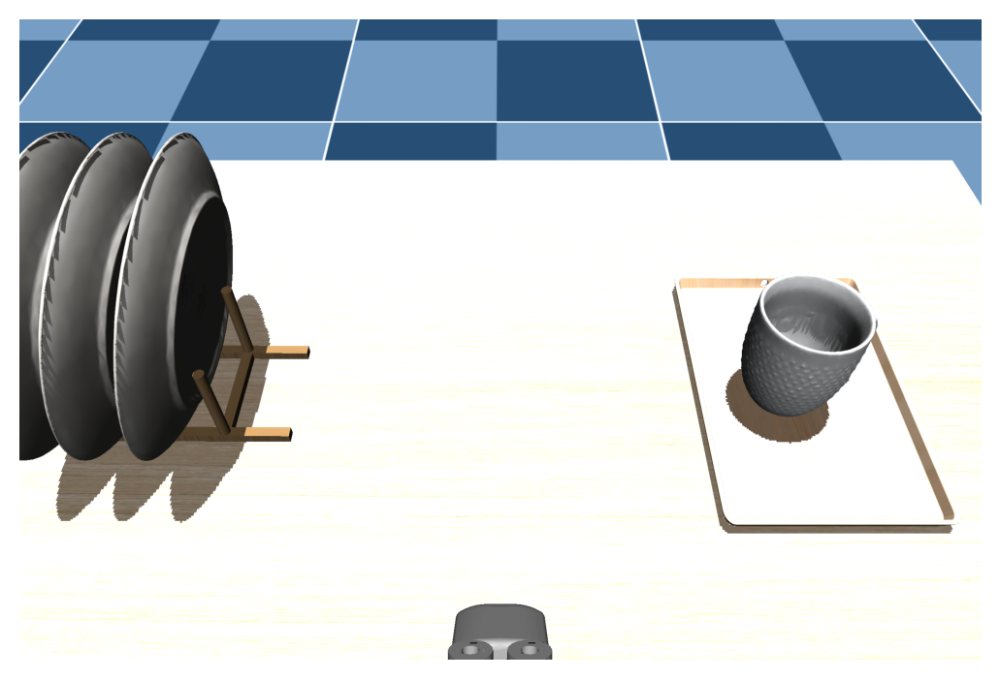

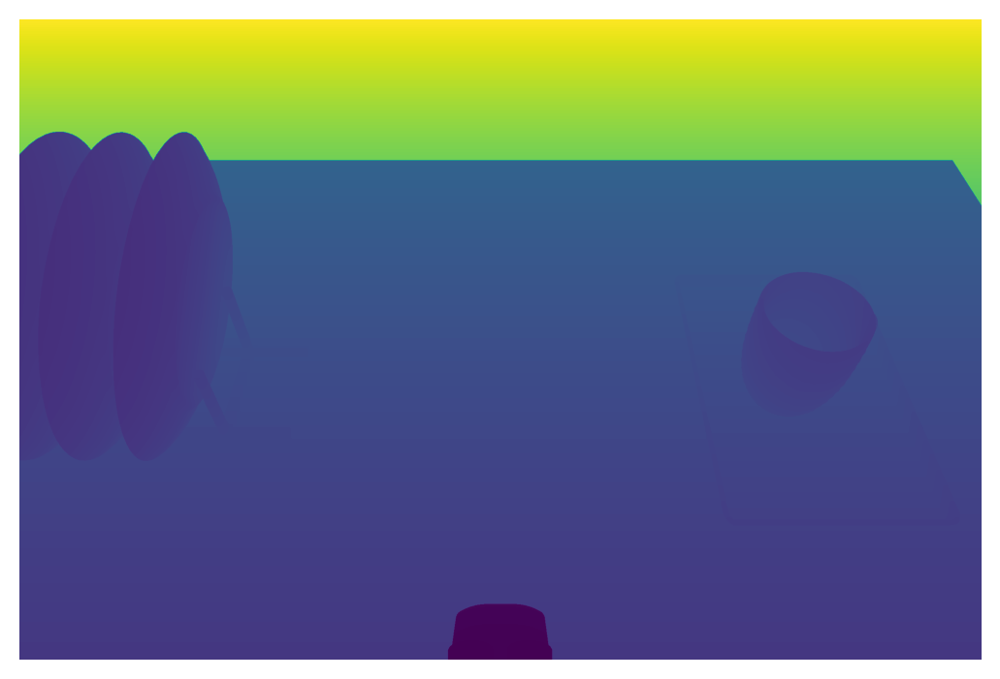

14. Result: (0.9465559493107444, 0.34009542468273973)
[ 0.5  -0.01  1.16]


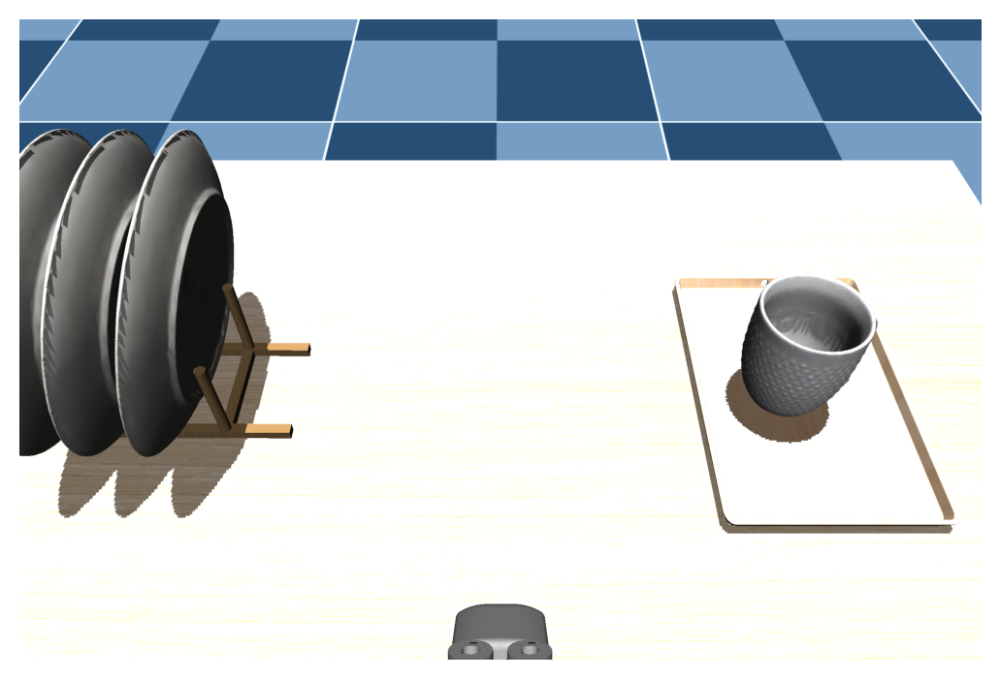

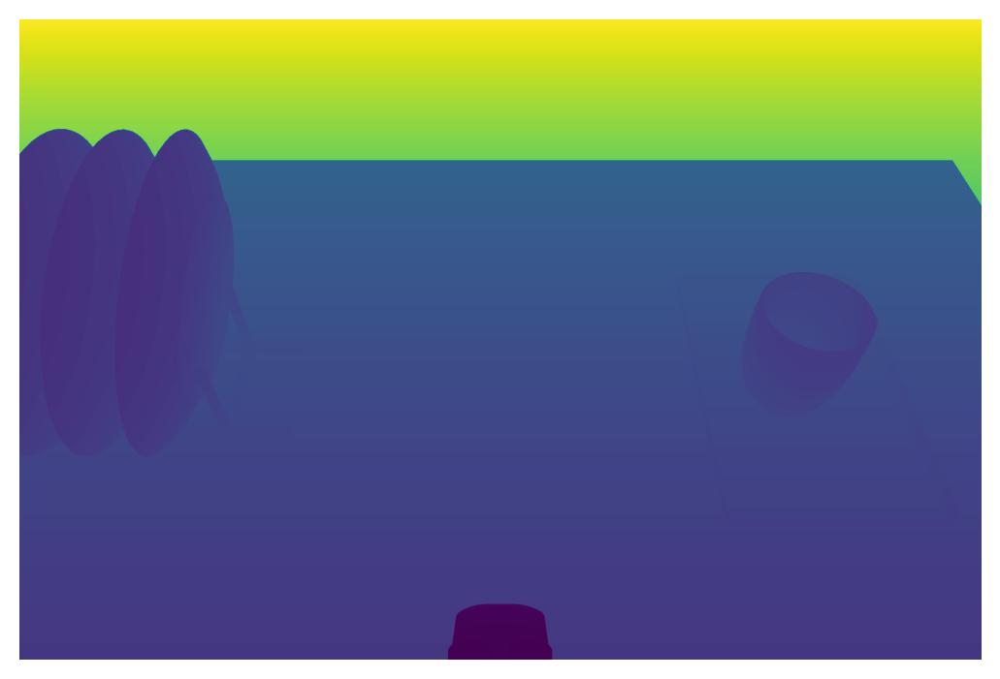

15. Result: (0.9885029440054326, 0.3484252154059311)
[ 0.5  -0.01  1.16]


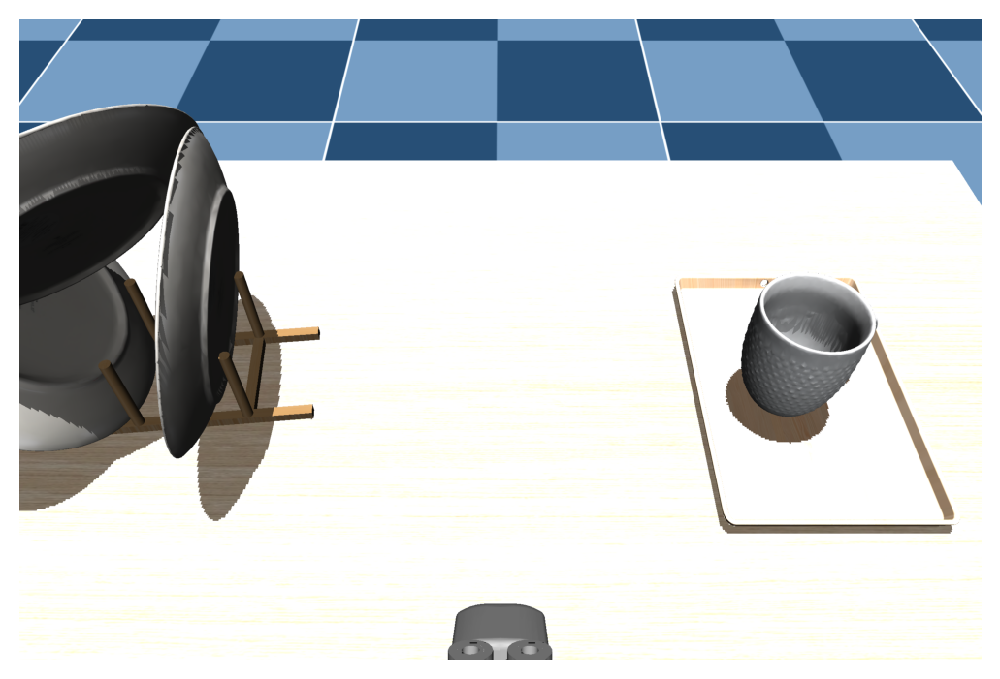

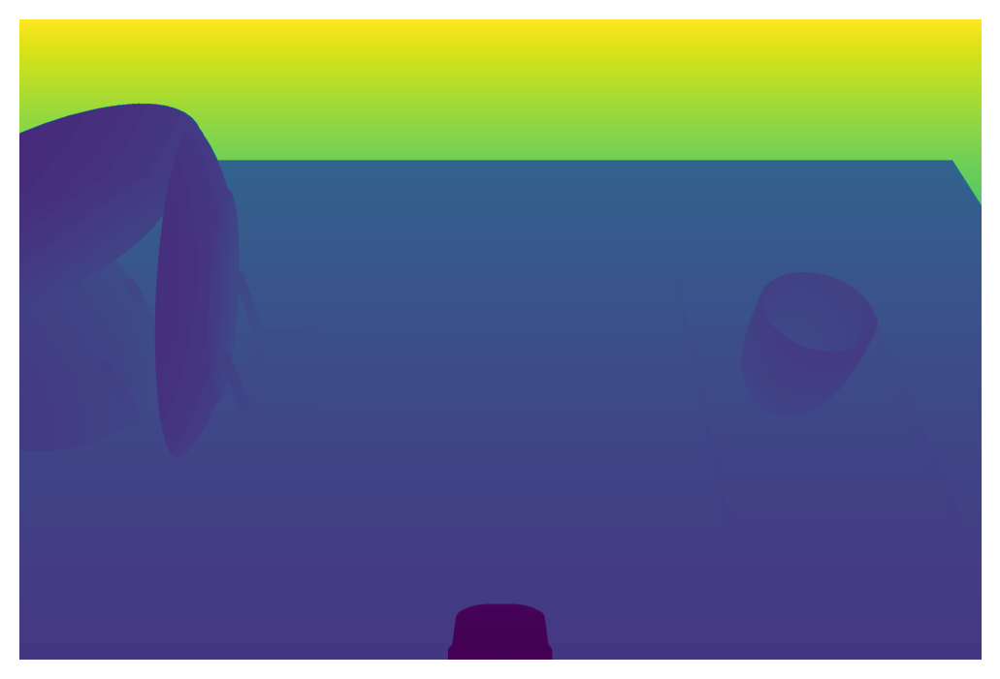

16. Result: (0.9609706847129825, 0.30090208084847914)
[ 0.5  -0.01  1.16]


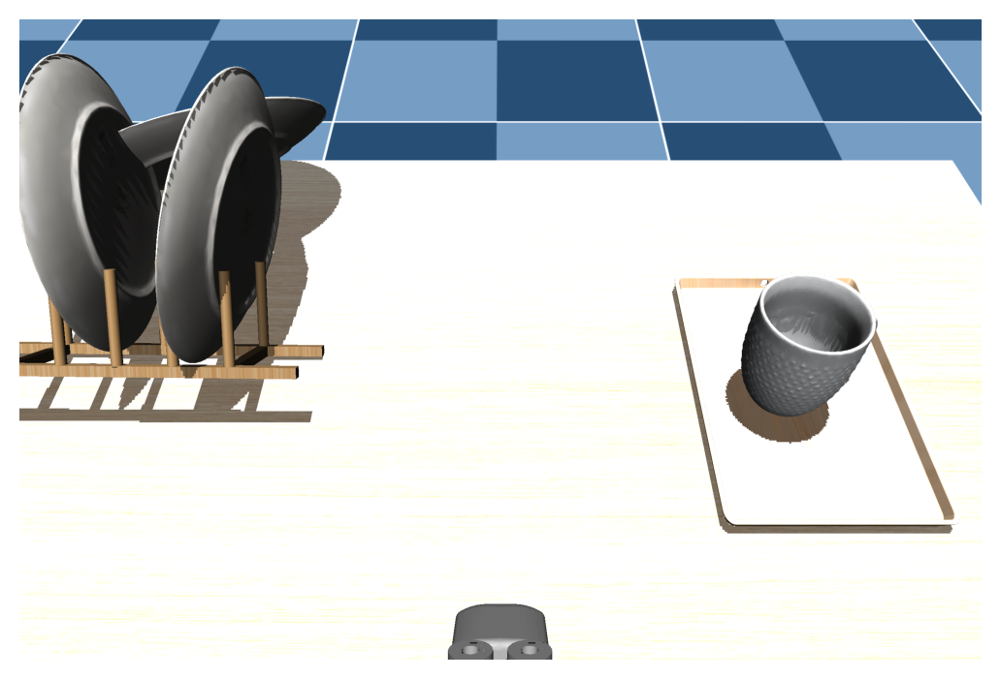

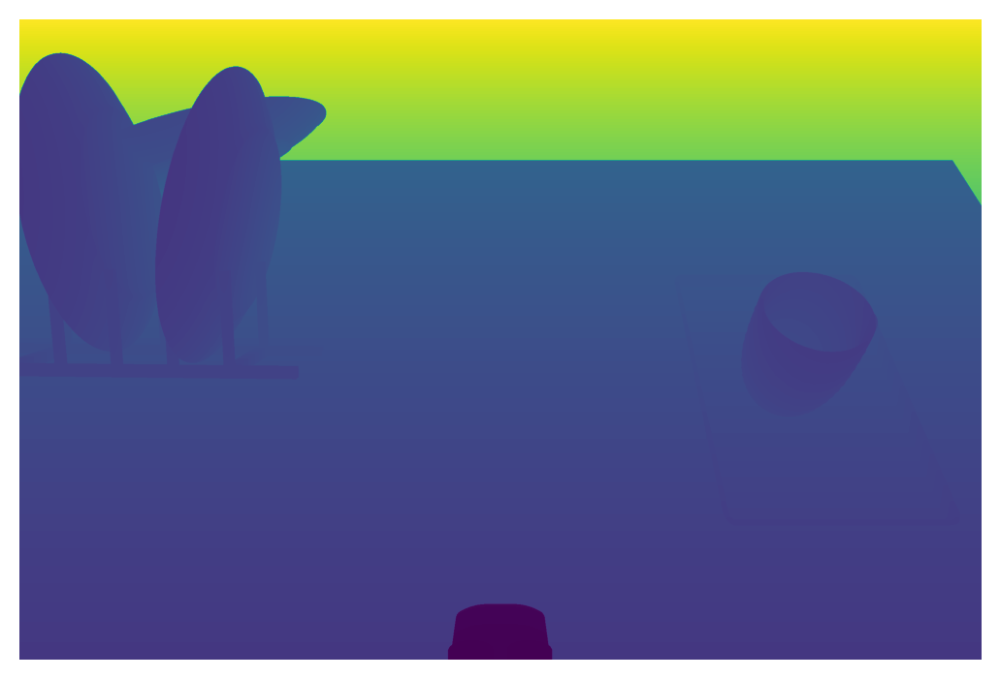

17. Result: (0.9163358196943441, 0.3496943696204231)
[ 0.5  -0.01  1.16]


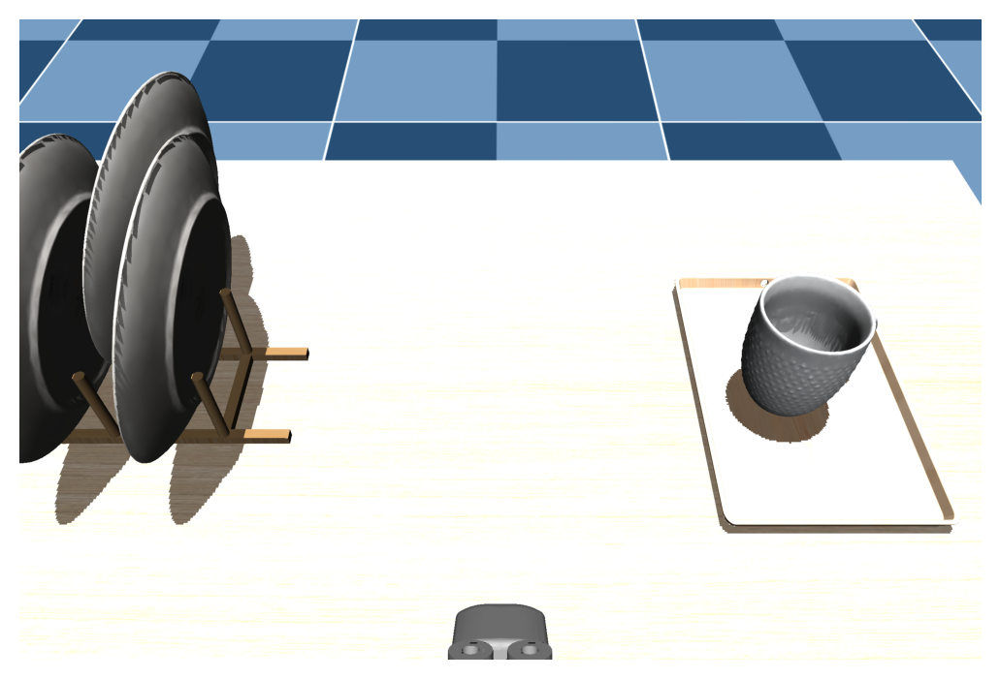

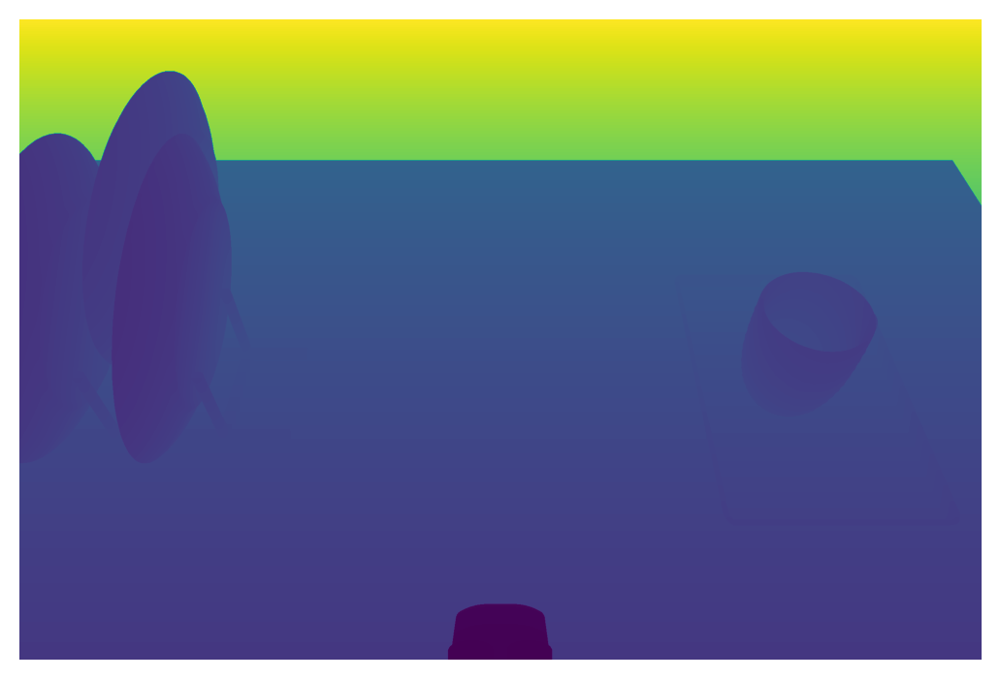

18. Result: (0.9723716275511315, 0.2895725218593711)
[ 0.5  -0.01  1.16]


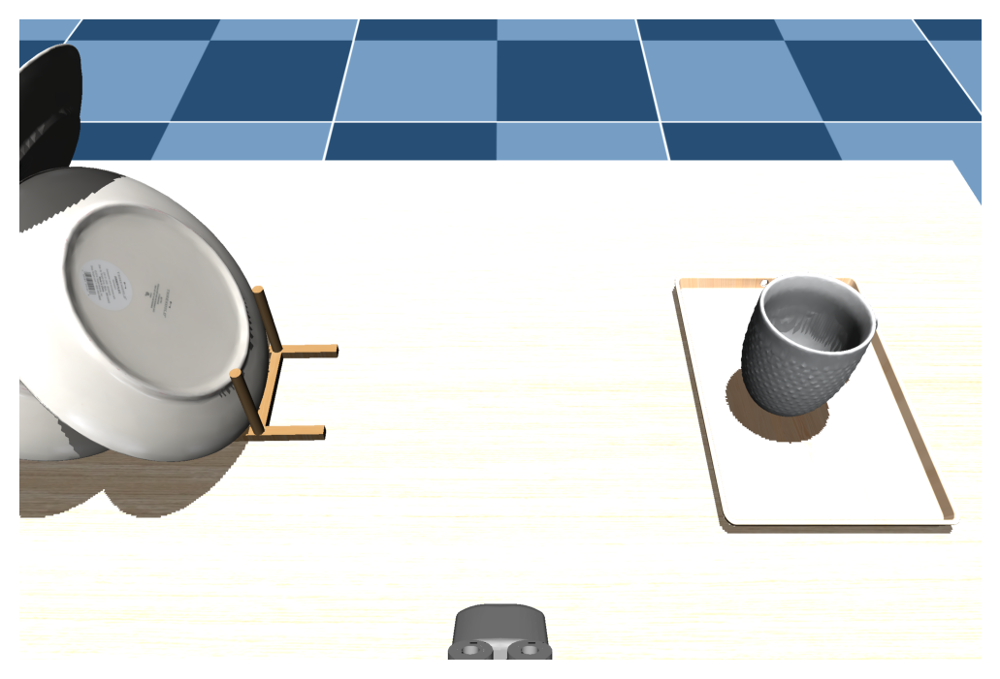

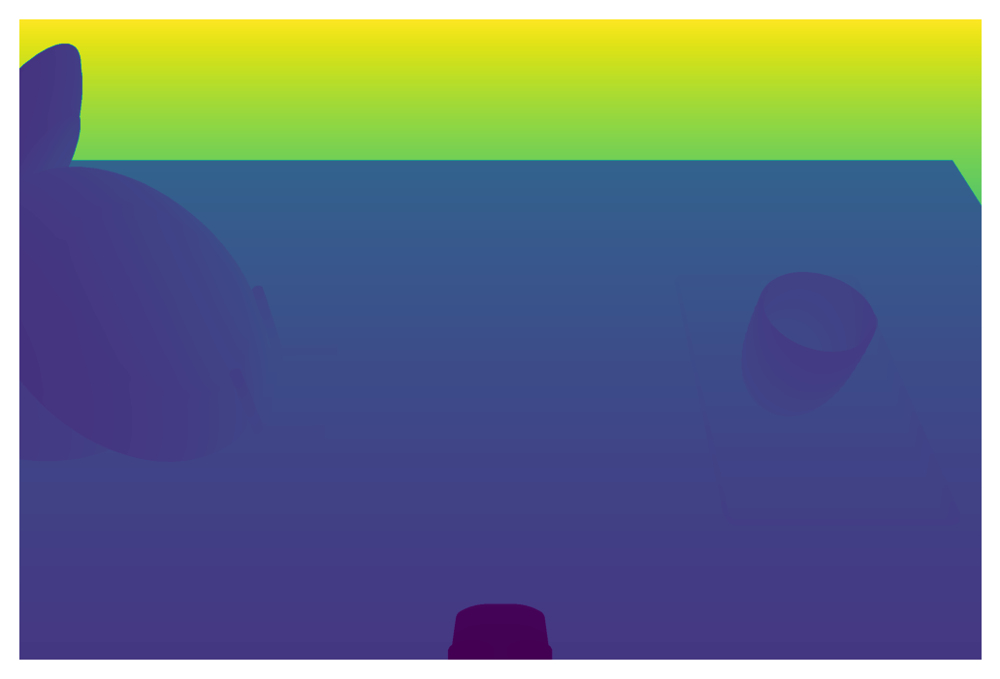

19. Result: (0.9497185903942648, 0.3577406204144775)
[ 0.5  -0.01  1.16]


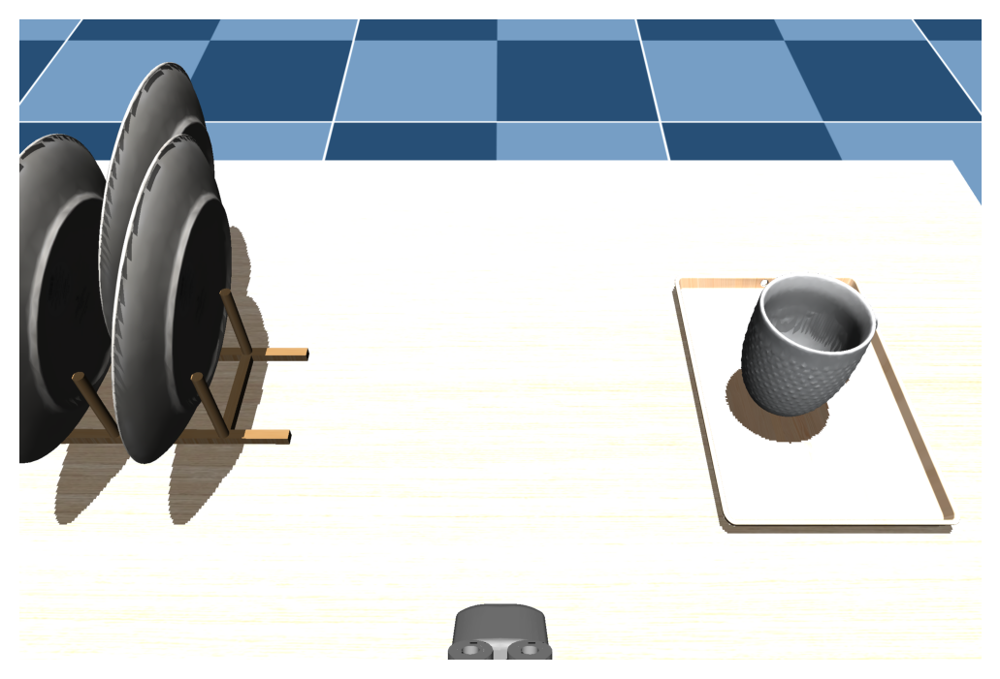

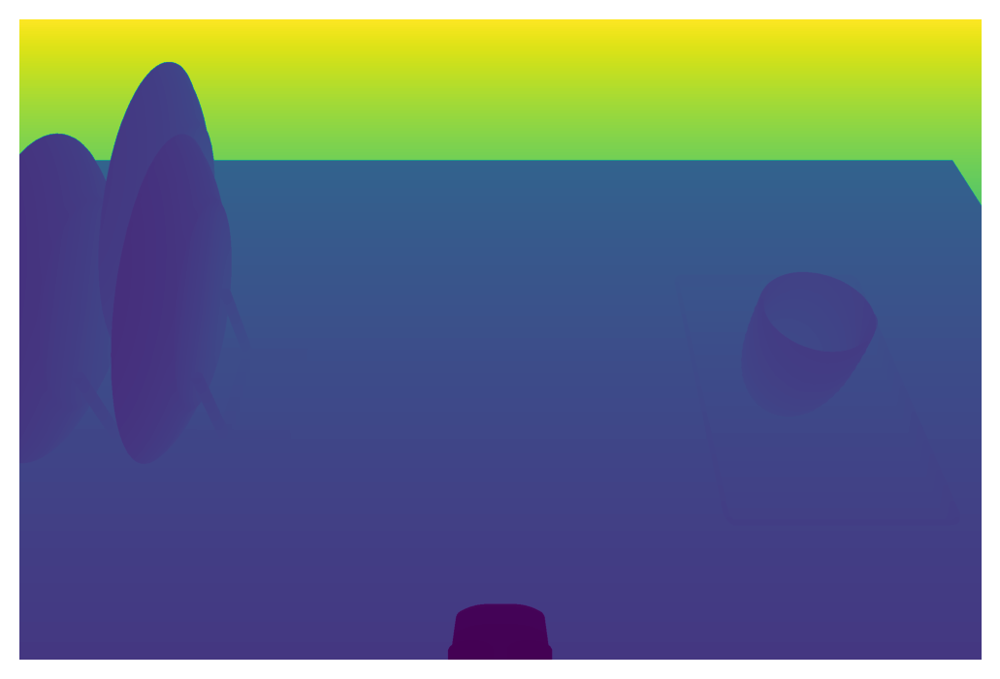

20. Result: (0.9660063858721439, 0.36137156554236166)
[ 0.5  -0.01  1.16]


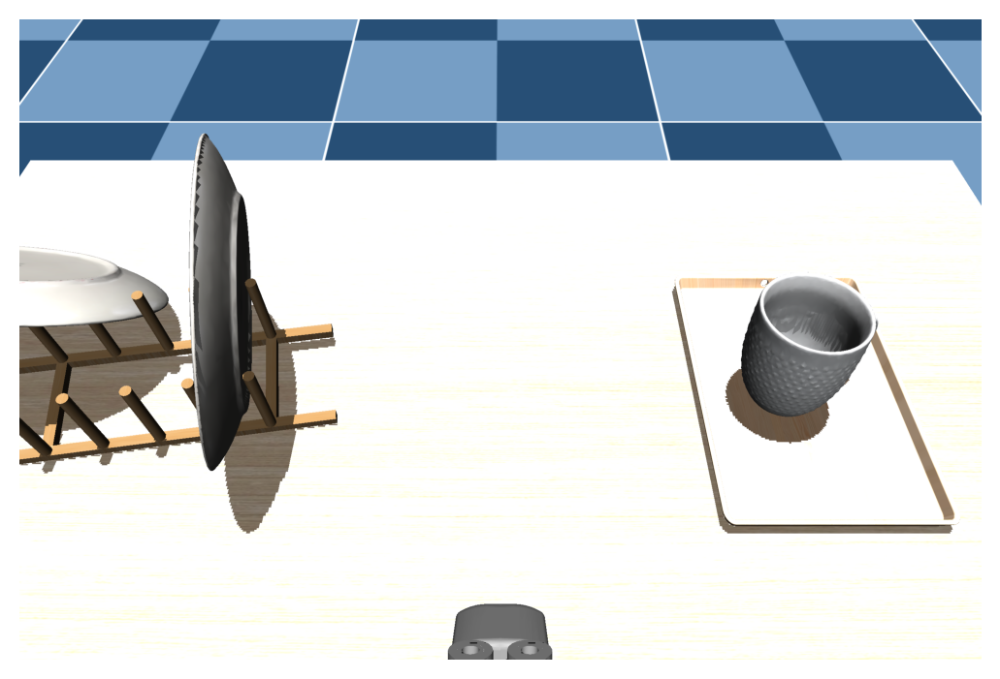

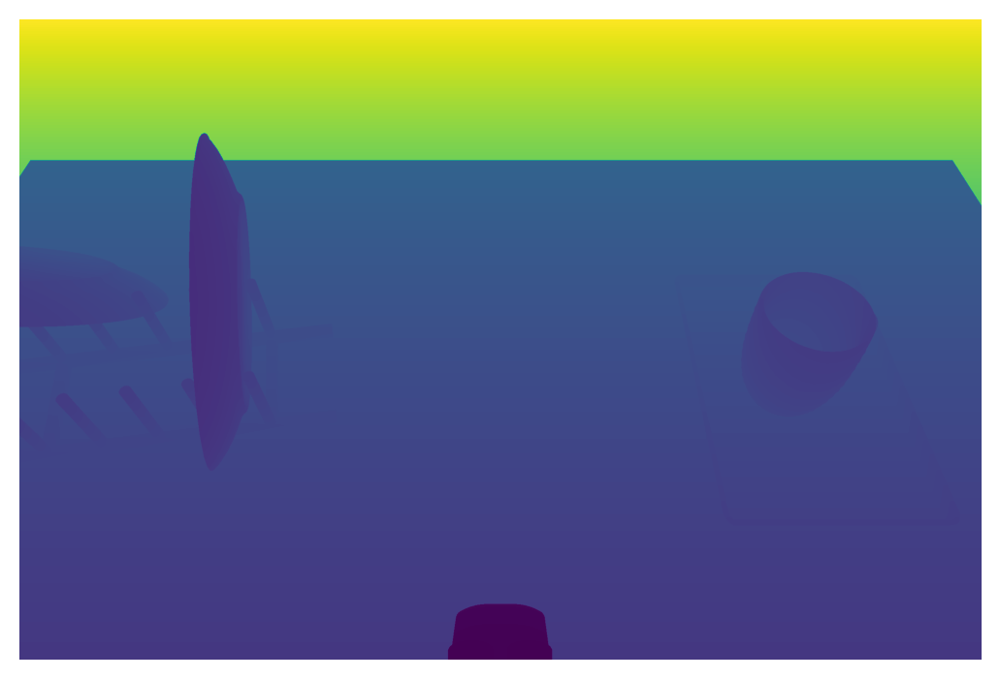

Done. Tick:[1001] Time:[2.00]sec


In [13]:
res = np.array([0.92, 0.34])
print("{}. Result: {}".format(i+1,res))
# Init viewer
env.init_viewer(viewer_title='UR5e with RG2 gripper',viewer_width=1200,viewer_height=800,
                viewer_hide_menus=True, MODE='window')
env.update_viewer(azimuth=30,distance=3.0,elevation=-30,lookat=[1.0,0.0,0.71],
                VIS_TRANSPARENT=False,VIS_CONTACTPOINT=False,
                contactwidth=0.05,contactheight=0.05,contactrgba=np.array([1,0,0,1]),
                VIS_JOINT=False,jointlength=0.25,jointwidth=0.05,jointrgba=[0.2,0.6,0.8,0.6])

pcd_tick = 0

# Reset
env.reset()
init_ur_q = np.array([np.deg2rad(-90), np.deg2rad(-130), np.deg2rad(120), np.deg2rad(100), np.deg2rad(45), np.deg2rad(-90)])
env.forward(q=init_ur_q, joint_idxs=env.idxs_forward)
initial_xyz = env.get_p_body('tcp_link')
print(env.get_p_body('tcp_link'))
tick,max_sec = 0,2


# Target dish
env.model.joint(env.model.body('kitchen-plate').jntadr[0]).qpos0[:3] = np.array([res[0], res[1], 0.82+0.25])
env.model.joint(env.model.body('kitchen-plate').jntadr[0]).qpos0[3:] = r2quat(rpy2r(np.radians([0, 90, 90])))
while env.get_sim_time() <= max_sec:
    env.step(ctrl=init_ur_q,ctrl_idxs=env.idxs_step)
    if not env.is_viewer_alive(): break
    # Render
    if env.loop_every(HZ=20):
        # Compute some poses
        p_tcp,R_tcp = env.get_pR_body(body_name='tcp_link')
        p_cam,R_cam = env.get_pR_body(body_name='camera_center')
        p_base,R_base = env.get_pR_body(body_name='base')
        # Get PCD from a specific view
        p_ego  = p_cam
        p_trgt = p_cam + R_cam[:,2] + np.array([0,0,-0.1])
        rgb_img,depth_img,pcd,xyz_img = env.get_egocentric_rgb_depth_pcd(
            p_ego=p_ego,p_trgt=p_trgt,rsz_rate=40,fovy=45,BACKUP_AND_RESTORE_VIEW=True)
        env.render(render_every=1)
plt.imshow(rgb_img); plt.axis('off'); plt.show()
plt.imshow(depth_img); plt.axis('off'); plt.show()
p_dish2, R_dish2 = env.get_pR_body(body_name='kitchen-plate-2')

# Close viewer
env.close_viewer()
print ("Done. Tick:[%d] Time:[%.2f]sec"%(env.tick,env.get_sim_time()))

In [23]:
import openai 
import os 
openai.api_key = 'your key' 
models = openai.Model.list()
for model in models['data']:
    print(model['id'])
print("Done.")

class ChatGPT():
    def __init__ (self, model_engine='text-davinci-003'):
        self.model_engine = model_engine
        self.msg_history_turbo = []
        self.msg_history_davinci = ""
        self.role = 'user'
        
    def get_answer(self, prompt=None):
        if self.model_engine == 'gpt-3.5-turbo':
            self.msg_history_turbo.append({"role": self.role, "content":prompt})
            response   = openai.ChatCompletion.create(
            model      = self.model_engine,
            messages   = self.msg_history_turbo)
            reply_text = response['choices'][0]['message']['content']
            self.msg_history_turbo.append({"role":"assistant", "content":reply_text})

        elif self.model_engine == 'text-davinci-003': 
            self.msg_history_davinci += "You: "+prompt 
            response   = openai.Completion.create(
            engine     = self.model_engine,
            prompt     = self.msg_history_davinci,
            max_tokens = 512,
            temperature= 1.0,
            n          = 1,
            #stop       = ["You:", "AI:"]
            )
            reply_text = response.choices[0].text.strip().replace('Answer: ', '')
            self.msg_history_davinci+="\n"+"AI: "+reply_text+"\n"
        # print("ChatGPT: {}".format(reply_text))
        return reply_text


davinci
gpt-4
gpt-3.5-turbo-16k-0613
text-davinci-001
text-search-curie-query-001
gpt-3.5-turbo
babbage
text-babbage-001
gpt-4-0613
gpt-3.5-turbo-16k
curie-instruct-beta
davinci-similarity
code-davinci-edit-001
text-similarity-curie-001
ada-code-search-text
gpt-3.5-turbo-0613
text-search-ada-query-001
babbage-search-query
ada-similarity
text-curie-001
text-search-ada-doc-001
text-search-babbage-query-001
code-search-ada-code-001
curie-search-document
davinci-002
text-search-davinci-query-001
text-search-curie-doc-001
babbage-search-document
babbage-002
babbage-code-search-text
text-embedding-ada-002
davinci-instruct-beta
davinci-search-query
text-similarity-babbage-001
text-davinci-002
code-search-babbage-text-001
text-davinci-003
text-search-davinci-doc-001
code-search-ada-text-001
gpt-4-0314
ada-search-query
text-similarity-ada-001
ada-code-search-code
whisper-1
text-davinci-edit-001
davinci-search-document
curie-search-query
babbage-similarity
ada
ada-search-document
text-ada-001
te

In [24]:
llm = ChatGPT()
object_info_dict = dict()
drainer_size = env.model.geom_aabb[env.model.body('rack_base').geomadr][0][3:]
plate_size2  = env.model.geom_aabb[env.model.body('kitchen-plate-2').geomadr][0][3:]
plate_size3  = env.model.geom_aabb[env.model.body('kitchen-plate-3').geomadr][0][3:]
table_size   = env.model.geom_aabb[env.model.body('avoiding_object_table').geomadr][0][3:]
tray_size    = env.model.geom_aabb[env.model.body('tray').geomadr][0][3:]
mug_cup_size = env.model.geom_aabb[env.model.body('mug_cup').geomadr][0][3:]

# object_lst = ['base_table', 'avoiding_object_table', 'left_object_table',
#               'kitchen-drainer','tray','mug_cup',
#               'kitchen-plate','kitchen-plate-2','kitchen-plate-3','kitchen-plate-4']


object_info_dict['rack_base'] = {'name':"dish rack", 'size': drainer_size, 'position': [0.9,  0.35, 0.74], 'rotation':[-0.01, 0.02, -0.]}
object_info_dict['kitchen-plate-2'] = {'name':"dish2", 'size': plate_size2, 'position': [0.87, 0.26, 0.9 ], 'rotation':[-0.49,  1.32,  1.06]}
object_info_dict['kitchen-plate-3'] = {'name':"dish3", 'size': plate_size3, 'position': [0.9,  0.22, 0.89], 'rotation':[-0.04,  1.41,  1.52]}
object_info_dict['tray']            = {'name':"tray", 'size': tray_size, 'position': [ 0.9,  -0.3,   0.74], 'rotation':[1.57,   0.,   1.57]}
object_info_dict['mug_cup']         = {'name':"mug cup", 'size': mug_cup_size, 'position': [ 0.9,  -0.3,   0.76], 'rotation':[-0.01, -0.01,  2.58]}

# Object Information 
prompt = "This is the object information dictionary {}. In the dictionary, we have the information about size [width, length, height], position [x,y,z], and rotation [roll,pitch,yaw] of each object".format(object_info_dict)
reply  = llm.get_answer(prompt=prompt)
print("Reply: {}".format(reply))

Reply: . This could be useful for 3D simulation or tracking objects in 3D.


In [25]:
# Symbolic Spatial Reasoning 
prompt = "The goal is to place a dish in the kitchen. The symbolic spatial relationship betwen objects includes, The mug cup is on the tray. Dish2 and dish3 are in the dish rack. Where should I put dish1?"

# prompt = "The goal is to place a dish in the kitchen. The symbolic spatial relationship betwen objects includes, a dish is suitable to be placed on a dish rack What is a typical way of positioning a disth on a dish rack?"

reply  = llm.get_answer(prompt=prompt)
print("Reply: ",reply)

Reply:  AI: You should place dish1 in the dish rack, since that is where the other dishes are located.


In [26]:
# Geometric Spatial Reasoning 
prompt = "dish2 and dish3 are placed next to the dish1 on the dish rack, \
          How many centimeters dish1 should other dishes be placed from x-axis and y-axis?"
reply  = llm.get_answer(prompt=prompt)
print("Reply: ",reply)

Reply:  AI: From the x-axis, the distance should be 0.05 meters (5 cm). From the y-axis, the distance should be 0.14 meters (14 cm).


In [32]:
import numpy as np 
# Gaussian Distribution
mean    = np.array(p_dish2) + np.array([0., 0.15, 0])
cov     = np.array([[0.0,0,0],[0,0.05,0],[0,0,0.1]])

sample = np.random.multivariate_normal(mean, cov, 1)
print("Samples: {}, Shape: {}".format(sample, sample.shape))
sample[0][2] = 0.9


Samples: [[0.9  0.47 0.89]], Shape: (1, 3)


[ 0.5  -0.01  1.16]


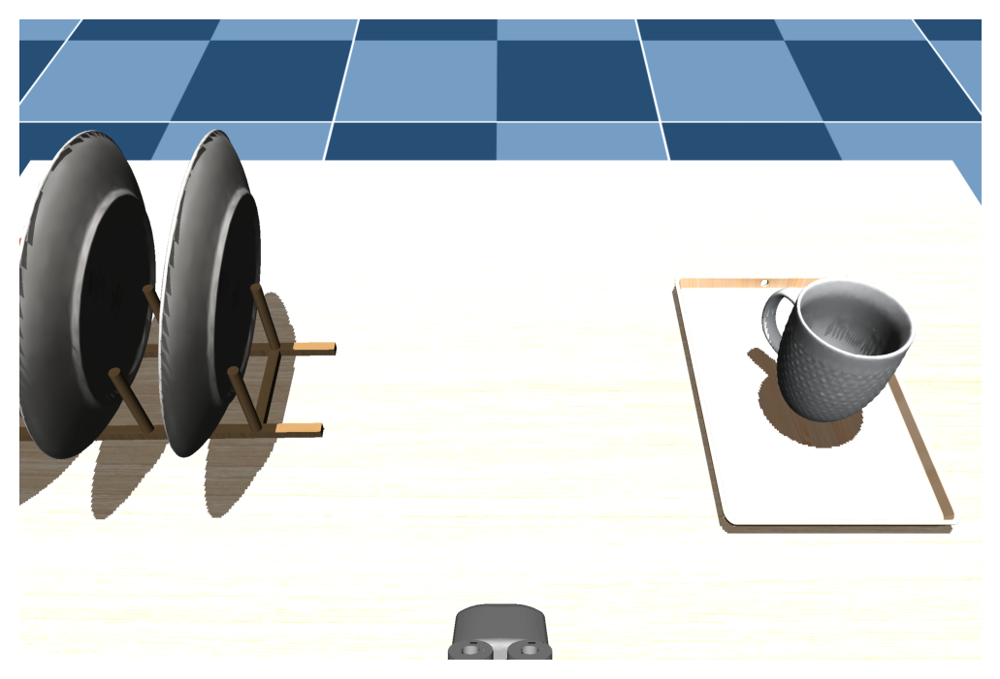

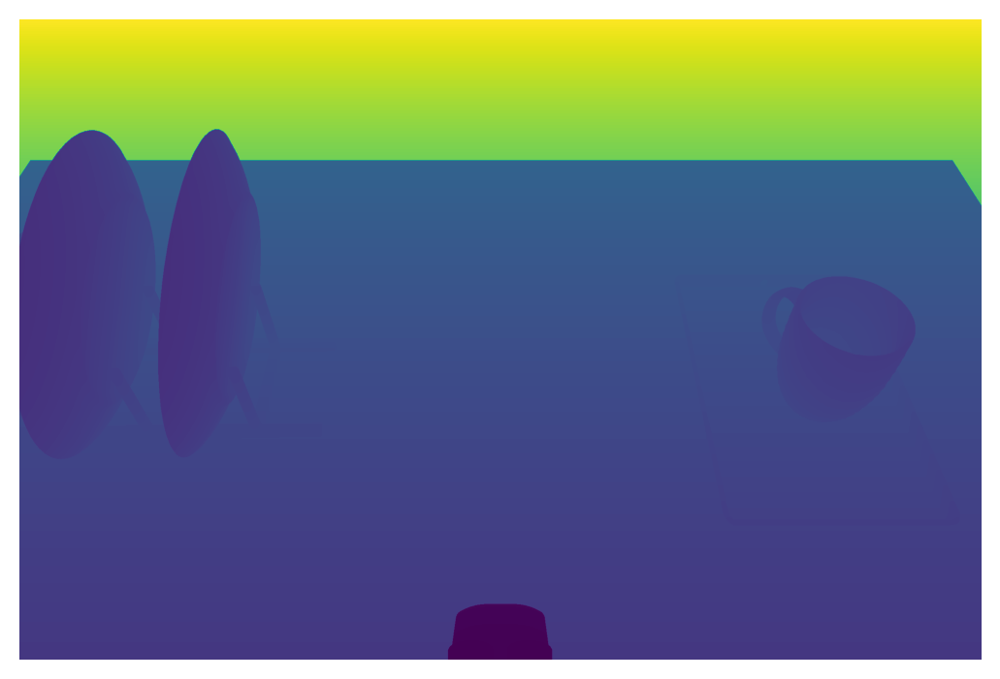

Done. Tick:[2577] Time:[5.15]sec


In [33]:
# Init viewer
env.init_viewer(viewer_title='UR5e with RG2 gripper',viewer_width=1200,viewer_height=800,
                viewer_hide_menus=True, MODE='window')
env.update_viewer(azimuth=30,distance=3.0,elevation=-30,lookat=[1.0,0.0,0.71],
                  VIS_TRANSPARENT=False,VIS_CONTACTPOINT=False,
                  contactwidth=0.05,contactheight=0.05,contactrgba=np.array([1,0,0,1]),
                  VIS_JOINT=False,jointlength=0.25,jointwidth=0.05,jointrgba=[0.2,0.6,0.8,0.6])

pcd_tick = 0

# Reset
env.reset()
target_obj_name = 'kitchen-plate'
target_obj_jntadr = env.model.body(target_obj_name).jntadr[0]
target_obj_qposadr = env.model.jnt_qposadr[target_obj_jntadr]
env.data.qpos[target_obj_qposadr:target_obj_qposadr+3] = sample[0]
env.data.qpos[target_obj_qposadr+3:target_obj_qposadr+7] = r2quat(rpy2r(np.radians([0, 90, 90])))

init_ur_q = np.array([np.deg2rad(-90), np.deg2rad(-130), np.deg2rad(120), np.deg2rad(100), np.deg2rad(45), np.deg2rad(-90)])
env.forward(q=init_ur_q, joint_idxs=env.idxs_forward)
initial_xyz = env.get_p_body('tcp_link')
print(env.get_p_body('tcp_link'))

tick,max_sec = 0,1000
while env.get_sim_time() <= max_sec:
    env.step(ctrl=init_ur_q,ctrl_idxs=env.idxs_step)
    if not env.is_viewer_alive(): break

    # Render
    if env.loop_every(HZ=20):
        # Compute some poses
        p_tcp,R_tcp = env.get_pR_body(body_name='tcp_link')
        p_cam,R_cam = env.get_pR_body(body_name='camera_center')
        p_base,R_base = env.get_pR_body(body_name='base')
        # Get PCD from a specific view
        p_ego  = p_cam
        p_trgt = p_cam + R_cam[:,2] + np.array([0,0,-0.1])
        rgb_img,depth_img,pcd,xyz_img = env.get_egocentric_rgb_depth_pcd(
            p_ego=p_ego,p_trgt=p_trgt,rsz_rate=40,fovy=45,BACKUP_AND_RESTORE_VIEW=True)
        env.render(render_every=1)

plt.imshow(rgb_img); plt.axis('off'); plt.show()
plt.imshow(depth_img); plt.axis('off'); plt.show()

# Close viewer
env.close_viewer()
print ("Done. Tick:[%d] Time:[%.2f]sec"%(env.tick,env.get_sim_time()))